[<img src="imagens/colab-badge.png" style="width:16%; vertical-align:middle;">](https://colab.research.google.com/github/fzampirolli/pdi-vc/blob/master/notebooks_alunos/cap05/cap05_aluno.ipynb)
[<img src="imagens/github-badge.png" style="width:20%; vertical-align:middle;">](https://github.com/fzampirolli/pdi-vc)

# 5 Transformadas e Compressão

> *"A Fourier transform does not change the information content of a signal; it changes the representation."* — R. C. Gonzalez & R. E. Woods

## 5.1 Motivação

Nos capítulos anteriores, todas as operações foram realizadas **no domínio espacial**: filtros de convolução, morfologia e segmentação atuam diretamente sobre os valores de intensidade dos pixels. Este capítulo apresenta uma perspectiva complementar e poderosa — o **domínio da frequência** — que revela como a imagem é construída a partir de padrões oscilatórios de diferentes escalas.

A ideia central é simples: **qualquer imagem pode ser decomposta em uma soma de senoides bidimensionais**, cada uma com frequência, amplitude e fase próprias. Baixas frequências correspondem a variações suaves (fundo, iluminação global); altas frequências correspondem a bordas, texturas e ruído.

```{figure} #fig-05-motivacao
:label: fig-05-motivacao
```

Esta decomposição abre três caminhos práticos:

1. **Filtragem espectral** — suprimir ou realçar seletivamente faixas de frequência;
2. **Análise multi-escala com wavelets** — capturar estruturas em diferentes resoluções e posições;
3. **Compressão** — eliminar coeficientes imperceptíveis ao olho humano, reduzindo o volume de dados.

O roteiro do capítulo segue a progressão *fenômeno → teoria → experimento → interpretação*, priorizando a intuição visual antes do formalismo matemático.

## 5.2 Objetivos de Aprendizagem

Ao concluir este capítulo, você será capaz de:

* **Interpretar o espectro de Fourier** de uma imagem: distinguir magnitude de fase, localizar baixas e altas frequências, e ler o espectro de forma intuitiva;
* **Aplicar o Teorema da Convolução** para implementar filtragem eficiente via FFT, compreendendo o ganho computacional em relação à convolução direta;
* **Projetar e comparar filtros espectrais** — passa-baixa (Ideal, Gaussiano, Butterworth), passa-alta e notch — com foco nos seus efeitos visuais e nos artefatos que produzem;
* **Compreender wavelets e multirresolução**: interpretar as subbandas LL/LH/HL/HH e relacionar a análise wavelet às camadas de CNNs;
* **Entender o pipeline JPEG**: desde a DCT em blocos 8×8 até a quantização perceptual e os artefatos de compressão;
* **Escolher o formato de imagem** adequado (JPEG, PNG, WebP) com base no conteúdo e na aplicação.

## 5.3 Configuração do Ambiente

In [9]:
import os, importlib, urllib.request
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy import ndimage

BASE_URL = "https://raw.githubusercontent.com/fzampirolli/pdi-vc/master/morph"
for f in ["morph.py"]:
    if not os.path.exists(f):
        urllib.request.urlretrieve(f"{BASE_URL}/{f}", f)

import morph
importlib.reload(morph)
from morph import mm

print("✅ Ambiente pronto")

✅ Ambiente pronto


## 5.4 A Transformada de Fourier Discreta 2D

### 5.4.1 Fenômeno: o que uma imagem "parece" no domínio da frequência?

Antes de qualquer fórmula, observe o que acontece quando transformamos uma fotografia: ela se transforma em um padrão radial brilhante ao centro, com energia decaindo progressivamente em direção às bordas. Esse padrão é o **espectro de magnitude** da imagem — uma radiografia da distribuição de frequências.

| Região do espectro | O que representa | Exemplos visuais |
|:---|:---|:---|
| **Centro** (baixas freq.) | Variações lentas — iluminação, cor de fundo, forma global | Gradientes suaves, blocos uniformes |
| **Meio** (médias freq.) | Texturas, padrões repetitivos | Tecidos, tijolos, grama |
| **Bordas** (altas freq.) | Variações abruptas — contornos, ruído | Bordas de objetos, grão de imagem |

> **Intuição-chave:** suprimir o centro do espectro remove a estrutura global e enfatiza bordas; suprimir as bordas suaviza a imagem e remove ruído. É precisamente isso que os filtros espectrais fazem — mas com precisão cirúrgica impossível no domínio espacial.

### 5.4.2 Definição Matemática

Dada uma imagem $f(x,y)$ de dimensões $M \times N$, sua **DFT 2D** é:

<a id="eq-05-dft"></a>
$$
F(u,v) = \sum_{x=0}^{M-1} \sum_{y=0}^{N-1} f(x,y)\, e^{-j2\pi\left(\frac{ux}{M}+\frac{vy}{N}\right)} \tag{5.1}
$$


e a **IDFT** recupera a imagem original:

<a id="eq-05-idft"></a>
$$
f(x,y) = \frac{1}{MN} \sum_{u=0}^{M-1} \sum_{v=0}^{N-1} F(u,v)\, e^{j2\pi\left(\frac{ux}{M}+\frac{vy}{N}\right)} \tag{5.2}
$$


$F(u,v)$ é complexo — decompõe-se em **magnitude** e **fase**:

$$
|F(u,v)| = \sqrt{\Re^2 + \Im^2} \qquad \phi(u,v) = \arctan\!\left(\frac{\Im}{\Re}\right)
$$

> ### 📝 O que é o componente DC?
>
> O coeficiente $F(0,0)$ — chamado **DC** (*Direct Current*) — corresponde à **média global** de todos os pixels. É sempre o valor de maior magnitude no espectro. Os demais coeficientes ($u,v \neq 0,0$) representam variações em torno da média.
>
> Após **fftshift** — deslocamento circular que move o DC para o centro —, o espectro fica intuitivo: centro = baixas frequências, bordas = altas frequências.

In [10]:
# @title { display-mode: "form" }
from IPython.display import HTML

HTML("""
<div style="font-family:sans-serif; max-width:680px; margin:0 auto; padding:10px;">
<div style="text-align:center; font-size:12px; font-weight:bold; color:#374151; margin-bottom:8px;">
  Anatomia do Espectro de Fourier 2D (após fftshift)
</div>
<svg viewBox="0 0 640 320" xmlns="http://www.w3.org/2000/svg" style="width:100%;border:1px solid #e5e7eb;border-radius:8px;background:#f9fafb;">
  <!-- Fundo gradiente radial simulado -->
  <defs>
    <radialGradient id="specGrad" cx="50%" cy="50%" r="50%">
      <stop offset="0%" style="stop-color:#1e3a5f;stop-opacity:1"/>
      <stop offset="20%" style="stop-color:#1a5276;stop-opacity:1"/>
      <stop offset="50%" style="stop-color:#0d2137;stop-opacity:1"/>
      <stop offset="100%" style="stop-color:#050e1a;stop-opacity:1"/>
    </radialGradient>
    <radialGradient id="brightCenter" cx="50%" cy="50%" r="15%">
      <stop offset="0%" style="stop-color:#ffffff;stop-opacity:1"/>
      <stop offset="60%" style="stop-color:#f0c040;stop-opacity:0.9"/>
      <stop offset="100%" style="stop-color:#1a5276;stop-opacity:0"/>
    </radialGradient>
  </defs>
  <rect x="20" y="10" width="380" height="300" fill="url(#specGrad)" rx="6"/>
  <rect x="20" y="10" width="380" height="300" fill="url(#brightCenter)" rx="6"/>
  <!-- Cruzes de alta energia (bordas horizontais/verticais) -->
  <line x1="210" y1="10" x2="210" y2="310" stroke="#4a9eda" stroke-width="1.5" opacity="0.4"/>
  <line x1="20" y1="160" x2="400" y2="160" stroke="#4a9eda" stroke-width="1.5" opacity="0.4"/>
  <!-- Círculos de frequência -->
  <circle cx="210" cy="160" r="30" fill="none" stroke="#f0c040" stroke-width="1" stroke-dasharray="4,3" opacity="0.7"/>
  <circle cx="210" cy="160" r="70" fill="none" stroke="#7dd3fc" stroke-width="1" stroke-dasharray="4,3" opacity="0.5"/>
  <circle cx="210" cy="160" r="120" fill="none" stroke="#93c5fd" stroke-width="0.8" stroke-dasharray="4,3" opacity="0.3"/>
  <!-- Ponto DC -->
  <circle cx="210" cy="160" r="6" fill="#ffffff"/>
  <!-- Rótulos no espectro -->
  <text x="210" y="148" font-size="9" fill="#fff" text-anchor="middle" font-weight="bold">DC</text>
  <text x="210" y="205" font-size="8" fill="#f0c040" text-anchor="middle">baixas freq.</text>
  <text x="210" y="245" font-size="8" fill="#7dd3fc" text-anchor="middle">médias freq.</text>
  <text x="330" y="110" font-size="8" fill="#93c5fd" text-anchor="middle">altas freq.</text>
  <text x="210" y="295" font-size="9" fill="#cbd5e1" text-anchor="middle" font-style="italic">Espectro de Magnitude |F(u,v)| — escala log</text>
  <!-- Painel direito: explicações -->
  <rect x="420" y="10" width="200" height="300" fill="#ffffff" rx="6" stroke="#e5e7eb"/>
  <text x="520" y="35" font-size="10" fill="#1e293b" text-anchor="middle" font-weight="bold">Regiões do Espectro</text>
  <!-- DC -->
  <circle cx="440" cy="65" r="7" fill="#ffffff" stroke="#f0c040" stroke-width="2"/>
  <text x="455" y="61" font-size="9" fill="#374151" font-weight="bold">DC (0,0)</text>
  <text x="455" y="73" font-size="8" fill="#6b7280">Média global dos pixels</text>
  <!-- Baixas -->
  <rect x="433" y="95" width="14" height="14" rx="2" fill="#f0c040" opacity="0.7"/>
  <text x="455" y="105" font-size="9" fill="#374151" font-weight="bold">Baixas frequências</text>
  <text x="455" y="116" font-size="8" fill="#6b7280">Forma, fundo, iluminação</text>
  <!-- Médias -->
  <rect x="433" y="135" width="14" height="14" rx="2" fill="#7dd3fc" opacity="0.7"/>
  <text x="455" y="145" font-size="9" fill="#374151" font-weight="bold">Médias frequências</text>
  <text x="455" y="156" font-size="8" fill="#6b7280">Texturas, padrões</text>
  <!-- Altas -->
  <rect x="433" y="175" width="14" height="14" rx="2" fill="#1e3a5f" stroke="#93c5fd" stroke-width="1"/>
  <text x="455" y="185" font-size="9" fill="#374151" font-weight="bold">Altas frequências</text>
  <text x="455" y="196" font-size="8" fill="#6b7280">Bordas, ruído, detalhes</text>
  <!-- Seta de eixos -->
  <text x="440" y="235" font-size="8" fill="#6b7280">u → freq. horizontal</text>
  <text x="440" y="248" font-size="8" fill="#6b7280">v → freq. vertical</text>
  <line x1="440" y1="265" x2="600" y2="265" stroke="#d1d5db" stroke-width="0.8"/>
  <text x="520" y="280" font-size="8" fill="#9ca3af" text-anchor="middle">Visualização em escala log</text>
  <text x="520" y="292" font-size="8" fill="#9ca3af" text-anchor="middle">log(1 + |F|) comprime o intervalo</text>
</svg>
</div>
""")

**Figura 5.1:** Diagrama conceitual do espectro de Fourier 2D centrado.


Dimensões          : (2560, 1920)
Componente DC      : 470086071.0  (média × M × N = 95.6 × 4915200)
% energia no DC    : 78.4%


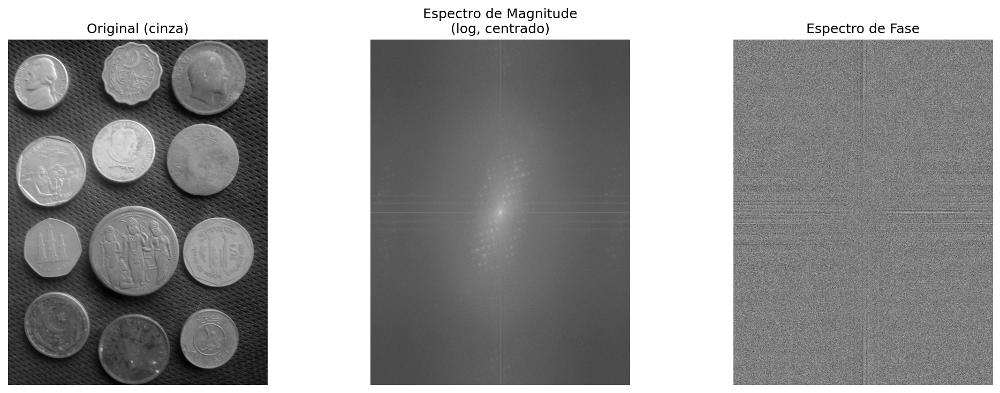

**Figura 5.2:** DFT de uma imagem natural: original, espectro de magnitude (log, centrado) e espectro de fase.


In [11]:
import os

# ── Carregamento da imagem ────────────────────────────────────────────────────
url     = "https://upload.wikimedia.org/wikipedia/commons/2/25/GAZI.MD.AHAD_11.jpg"
caminho = "imagens/coins.jpg"

if not os.path.exists(caminho):
    os.makedirs("imagens", exist_ok=True)
    img_obj = mm.read(url, pil=True)
    mm.write(img_obj, caminho)
else:
    img_obj = mm.read(caminho, pil=True)

img_color = np.array(img_obj)
img_gray  = mm.gray(img_color)

# ── DFT 2D ───────────────────────────────────────────────────────────────────
F    = np.fft.fft2(img_gray)           # transformada complexa
F_sh = np.fft.fftshift(F)              # DC no centro
mag  = np.log1p(np.abs(F_sh))          # magnitude em escala logarítmica
fase = np.angle(F_sh)                  # fase em radianos [-π, π]

# Normalização para exibição
mag_vis  = cv2.normalize(mag,  None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
fase_vis = cv2.normalize(fase, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

print(f"Dimensões          : {img_gray.shape}")
print(f"Componente DC      : {np.abs(F[0,0]):.1f}  (média × M × N = {img_gray.mean():.1f} × {img_gray.shape[0]*img_gray.shape[1]})")
print(f"% energia no DC    : {np.abs(F[0,0])**2 / (np.abs(F)**2).sum():.1%}")

mm.show(
    [img_gray, mag_vis, fase_vis],
    titles=["Original (cinza)", "Espectro de Magnitude\n(log, centrado)", "Espectro de Fase"],
    cols=3, figsize=(14, 5)
)

### 5.4.3 O que a Magnitude e a Fase carregam?

Uma das demonstrações mais reveladoras em PDI é trocar os espectros de magnitude e fase entre duas imagens distintas e reconstruir cada uma. O resultado mostra que:

- **A fase carrega a estrutura semântica** — contornos, posição dos objetos, geometria da cena;
- **A magnitude carrega o conteúdo energético e textural** — contraste, iluminação geral.

Quando reconstruímos uma imagem com a **magnitude de A** mas a **fase de B**, o resultado se parece com B — mesmo usando a "energia" de A. A fase domina a percepção de forma.

> **Analogia auditiva:** no áudio, a fase determina a percepção de posição (esquerda/direita). Na imagem, ela determina a posição e forma dos objetos. Inverter a fase de uma música torna-a irreconhecível mesmo que a magnitude (timbre) permaneça intacta.

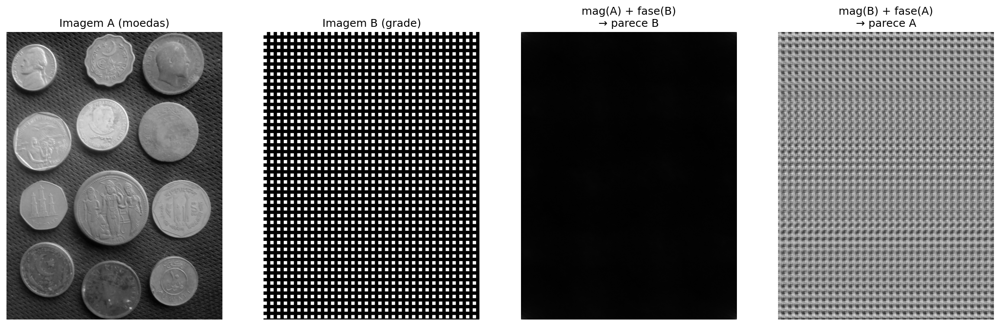

**Figura 5.3:** Reconstrução cruzada: magnitude × fase. A imagem reconstruída se assemelha àquela cuja fase foi usada.


Conclusão: a FASE domina a percepção de estrutura e forma.


In [12]:
# ── Imagem B sintética ────────────────────────────────────────────────────────
h, w   = img_gray.shape
img_B  = np.zeros((h, w), dtype=np.uint8)
for i in range(0, h, 60):
    for j in range(0, w, 60):
        img_B[i:i+30, j:j+30] = 200

# ── DFT das duas imagens ──────────────────────────────────────────────────────
FA = np.fft.fft2(img_gray.astype(np.float32))
FB = np.fft.fft2(img_B.astype(np.float32))

mag_A,  fase_A = np.abs(FA), np.angle(FA)
mag_B,  fase_B = np.abs(FB), np.angle(FB)

def recombinar(mag, fase):
    """Reconstrói imagem a partir de magnitude e fase separadas."""    
    F_rec = mag * np.exp(1j * fase)
    rec   = np.real(np.fft.ifft2(F_rec))
    return cv2.normalize(rec, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

rec_Afase_B = recombinar(mag_A, fase_B)   # magnitude de A + fase de B  → parece B
rec_Bfase_A = recombinar(mag_B, fase_A)   # magnitude de B + fase de A  → parece A

mm.show(
    [img_gray, img_B, rec_Afase_B, rec_Bfase_A],
    titles=[
        "Imagem A (moedas)",
        "Imagem B (grade)",
        "mag(A) + fase(B)\n→ parece B",
        "mag(B) + fase(A)\n→ parece A"
    ],
    cols=4, figsize=(16, 5)
)
print("Conclusão: a FASE domina a percepção de estrutura e forma.")

### 5.4.4 Simulador: Reconstruindo Sinais com Senoides

Antes de prosseguir para imagens 2D, o simulador interativo abaixo permite explorar a essência da análise de Fourier 1D: **qualquer forma de onda pode ser reconstruída somando-se senoides simples**.

Observe como, ao adicionar mais termos, a soma (curva preta) converge progressivamente para a forma alvo (tracejada). O espectro abaixo mostra as amplitudes de cada frequência — é a "receita" da forma de onda.

In [13]:
# @title { display-mode: "form" }
from IPython.display import HTML

HTML("""
<div id="fft_Root">
<style>
  #fft_Root * { box-sizing: border-box; }
  #fft_Root { font-family: sans-serif; padding: 10px; max-width: 700px; margin: 0 auto; color: #374151; }
  #fft_Root canvas { display: block; max-width: 100%; height: auto; border-radius: 6px; border: 1px solid #d1d5db; background: #fff; }
  #fft_Root button { font-size: 11px; padding: 5px 10px; border-radius: 4px; border: 1px solid #d1d5db; background: #fff; color: #374151; cursor: pointer; transition: background 0.15s; }
  #fft_Root button:hover { background: #f3f4f6; }
  #fft_Root button.fft_active { background: #e0f2fe; border-color: #7dd3fc; color: #0369a1; font-weight: bold; }
  .fft_panel { background: #f9fafb; border: 1px solid #e5e7eb; border-radius: 6px; padding: 8px; }
  .fft_pill { font-size: 10px; font-weight: bold; padding: 3px 8px; border-radius: 4px; border: 1px solid #7dd3fc; background: #e0f2fe; color: #0369a1; }
  .fft_stat_box { background: #f9fafb; border: 1px solid #e5e7eb; border-radius: 6px; padding: 8px; text-align: center; flex: 1; min-width: 90px; }
  .fft_stat_label { font-size: 9px; color: #6b7280; text-transform: uppercase; letter-spacing: 0.04em; margin-bottom: 2px; }
  .fft_stat_value { font-size: 16px; font-weight: bold; font-family: monospace; }
</style>
<div class="fft_panel" style="display:flex;justify-content:space-between;align-items:center;margin-bottom:10px;flex-wrap:wrap;gap:6px;">
  <span style="font-size:12px;font-weight:bold;color:#4b5563;">∿ Simulador: Decomposição de Fourier 1D</span>
  <span class="fft_pill">soma de senoides</span>
</div>
<div style="display:flex;gap:8px;margin-bottom:10px;flex-wrap:wrap;">
  <div class="fft_stat_box"><div class="fft_stat_label">Termos</div><div id="fft_nTerms" class="fft_stat_value" style="color:#534AB7;">1</div></div>
  <div class="fft_stat_box"><div class="fft_stat_label">Erro RMS</div><div id="fft_rms" class="fft_stat_value" style="color:#D85A30;">–</div></div>
  <div class="fft_stat_box"><div class="fft_stat_label">Forma Alvo</div><div id="fft_target" class="fft_stat_value" style="color:#1D9E75;font-size:13px;">quadrada</div></div>
</div>
<canvas id="fft_Canvas" width="660" height="200"></canvas>
<canvas id="fft_SpecCanvas" width="660" height="80" style="margin-top:6px;"></canvas>
<div style="display:flex;gap:8px;margin-top:10px;flex-wrap:wrap;">
  <div class="fft_panel" style="flex:1;min-width:200px;">
    <div style="font-size:11px;font-weight:bold;margin-bottom:6px;">Forma Alvo</div>
    <div style="display:flex;gap:4px;flex-wrap:wrap;">
      <button id="fft_sq" class="fft_active" onclick="fft_setTarget('square')">Quadrada</button>
      <button id="fft_tr" onclick="fft_setTarget('triangle')">Triangular</button>
      <button id="fft_sw" onclick="fft_setTarget('sawtooth')">Dente-Serra</button>
    </div>
  </div>
  <div class="fft_panel" style="flex:1;min-width:160px;">
    <div style="font-size:11px;font-weight:bold;margin-bottom:6px;">Nº de Termos</div>
    <div style="display:flex;align-items:center;gap:6px;">
      <input type="range" id="fft_slider" min="1" max="25" value="1" style="flex:1;">
      <span id="fft_slVal" style="font-size:12px;font-family:monospace;min-width:22px;">1</span>
    </div>
  </div>
  <div class="fft_panel" style="flex:1;min-width:120px;">
    <div style="font-size:11px;font-weight:bold;margin-bottom:6px;">Exibição</div>
    <div style="display:flex;gap:4px;">
      <button id="fft_chk_comp" class="fft_active" onclick="fft_toggleComp()">Componentes</button>
      <button id="fft_chk_sum" class="fft_active" onclick="fft_toggleSum()">Soma</button>
    </div>
  </div>
</div>
<div id="fft_termList" style="margin-top:10px;display:flex;gap:6px;flex-wrap:wrap;"></div>
<script>
(function(){
  const C=document.getElementById('fft_Canvas'),S=document.getElementById('fft_SpecCanvas');
  const ctx=C.getContext('2d'),sctx=S.getContext('2d');
  const N=512;let nTerms=1,showComp=true,showSum=true,targetType='square';
  const PALETTE=['#534AB7','#1D9E75','#BA7517','#D85A30','#185FA5','#993556','#639922','#A32D2D'];
  function getTerms(type,n){const terms=[];for(let k=1;k<=n;k++){let freq,amp,phase=0;if(type==='square'){const m=2*k-1;freq=m;amp=(4/Math.PI)*(1/m);}else if(type==='triangle'){const m=2*k-1;freq=m;amp=(8/Math.PI**2)*(1/m**2);phase=(k%2===0)?Math.PI:0;}else{freq=k;amp=(2/Math.PI)*(1/k);phase=-Math.PI/2;}terms.push({freq,amp,phase});}return terms;}
  function getTarget(type){const t=new Float32Array(N);for(let i=0;i<N;i++){const x=i/N;if(type==='square')t[i]=x<0.5?1:-1;else if(type==='triangle')t[i]=x<0.5?(4*x-1):(3-4*x);else t[i]=2*x-1;}return t;}
  function evalTerms(terms){const sig=new Float32Array(N);for(const{freq,amp,phase}of terms)for(let i=0;i<N;i++)sig[i]+=amp*Math.sin(2*Math.PI*freq*i/N+phase);return sig;}
  function draw(){
    const W=C.width,H=C.height;ctx.clearRect(0,0,W,H);ctx.fillStyle='#ffffff';ctx.fillRect(0,0,W,H);
    const terms=getTerms(targetType,nTerms),sum=evalTerms(terms),target=getTarget(targetType);
    let rms=0;for(let i=0;i<N;i++)rms+=(sum[i]-target[i])**2;rms=Math.sqrt(rms/N);
    ctx.strokeStyle='#e5e7eb';ctx.lineWidth=0.5;ctx.setLineDash([3,3]);
    ctx.beginPath();ctx.moveTo(0,H/2);ctx.lineTo(W,H/2);ctx.stroke();ctx.setLineDash([]);
    if(showComp)for(let k=0;k<terms.length;k++){const{freq,amp,phase}=terms[k];ctx.strokeStyle=PALETTE[k%PALETTE.length]+'55';ctx.lineWidth=1;ctx.beginPath();for(let i=0;i<N;i++){const x=i*W/N,y=H/2-amp*Math.sin(2*Math.PI*freq*i/N+phase)*H/3;i===0?ctx.moveTo(x,y):ctx.lineTo(x,y);}ctx.stroke();}
    ctx.strokeStyle='#e5e7eb';ctx.lineWidth=1.5;ctx.setLineDash([4,4]);ctx.beginPath();for(let i=0;i<N;i++){const x=i*W/N,y=H/2-target[i]*H/3;i===0?ctx.moveTo(x,y):ctx.lineTo(x,y);}ctx.stroke();ctx.setLineDash([]);
    if(showSum){ctx.strokeStyle='#1e293b';ctx.lineWidth=2;ctx.beginPath();for(let i=0;i<N;i++){const x=i*W/N,y=H/2-sum[i]*H/3;i===0?ctx.moveTo(x,y):ctx.lineTo(x,y);}ctx.stroke();}
    const SW=S.width,SH=S.height;sctx.clearRect(0,0,SW,SH);sctx.fillStyle='#f9fafb';sctx.fillRect(0,0,SW,SH);
    const maxFreq=getTerms(targetType,25)[24].freq;
    for(let k=0;k<terms.length;k++){const{freq,amp}=terms[k];const x=freq/maxFreq*SW;const h2=amp/2*SH*0.8;sctx.fillStyle=PALETTE[k%PALETTE.length];sctx.fillRect(x-2,SH-h2,4,h2);}
    sctx.strokeStyle='#d1d5db';sctx.lineWidth=0.5;sctx.strokeRect(0,0,SW,SH);
    sctx.fillStyle='#9ca3af';sctx.font='9px monospace';sctx.textAlign='left';sctx.fillText('Espectro de Amplitude (frequência →)',4,12);
    document.getElementById('fft_nTerms').textContent=nTerms;document.getElementById('fft_rms').textContent=rms.toFixed(3);
    const tl=document.getElementById('fft_termList');tl.innerHTML='';
    for(let k=0;k<Math.min(terms.length,8);k++){const{freq,amp}=terms[k];const d=document.createElement('span');d.style.cssText='font-size:10px;display:flex;align-items:center;gap:3px;';d.innerHTML=`<span style="width:10px;height:10px;border-radius:2px;background:${PALETTE[k%PALETTE.length]};display:inline-block;"></span> k=${freq} A=${amp.toFixed(2)}`;tl.appendChild(d);}
  }
  window.fft_setTarget=function(t){targetType=t;['sq','tr','sw'].forEach(id=>document.getElementById('fft_'+id).classList.remove('fft_active'));const map={square:'sq',triangle:'tr',sawtooth:'sw'};document.getElementById('fft_'+map[t]).classList.add('fft_active');document.getElementById('fft_target').textContent={square:'quadrada',triangle:'triangular',sawtooth:'dente-serra'}[t];draw();};
  window.fft_toggleComp=function(){showComp=!showComp;document.getElementById('fft_chk_comp').classList.toggle('fft_active',showComp);draw();};
  window.fft_toggleSum=function(){showSum=!showSum;document.getElementById('fft_chk_sum').classList.toggle('fft_active',showSum);draw();};
  document.getElementById('fft_slider').addEventListener('input',function(){nTerms=+this.value;document.getElementById('fft_slVal').textContent=nTerms;draw();});
  draw();
})();
</script>
</div>
""")

**Figura 5.4:** Simulador interativo de decomposição de Fourier 1D.


### 📌 Síntese — DFT 2D

| Conceito | Interpretação |
|:---|:---|
| Magnitude $|F(u,v)|$ | Intensidade de cada frequência na imagem |
| Fase $\phi(u,v)$ | Posição/estrutura dos padrões — domina a percepção de forma |
| DC $F(0,0)$ | Média global × dimensões da imagem |
| fftshift | Move o DC para o centro — facilita visualização e filtros radiais |
| Escala log | Comprime a dinâmica — torna visíveis componentes de pequena amplitude |

A DFT não elimina nem adiciona informação: apenas **muda a representação** — do domínio espacial para o domínio da frequência.

## 5.5 Teorema da Convolução e Filtragem via FFT

### 5.5.1 O Teorema em Palavras

O Teorema da Convolução é um dos resultados mais elegantes da teoria de sinais:

> **Convolução no domínio espacial ≡ Multiplicação no domínio da frequência.**

<a id="eq-05-conv-teorema"></a>
$$
f(x,y) * h(x,y) \;\xleftrightarrow{\mathcal{F}}\; F(u,v) \cdot H(u,v) \tag{5.3}
$$


Isso significa que, em vez de deslizar um kernel sobre cada pixel da imagem (o que é lento para kernels grandes), podemos:

1. Transformar a imagem para o domínio da frequência via FFT;
2. **Multiplicar** ponto a ponto pelo espectro do filtro;
3. Transformar de volta via IFFT.

### 5.5.2 Por que isso importa na prática?

| Método | Complexidade | Exemplo: $N=512$, kernel $51\times51$ |
|:---|:---:|:---:|
| Convolução direta | $O(N^2 K^2)$ | ≈ 682 milhões de operações |
| Filtragem via FFT | $O(N^2 \log N)$ | ≈ 2,4 milhões de operações |

A vantagem é dramaticamente maior quanto maior o kernel. Filtros de suavização forte (e.g., Gaussiano $\sigma=20$, kernel $\approx 120\times120$) tornam-se viáveis apenas via FFT.

> ### 📝 Zero-padding e artefatos de borda
>
> A DFT assume que o sinal é **periódico** — como se a imagem se repetisse infinitamente. Quando a imagem tem descontinuidades nas bordas (quase sempre), surgem **artefatos de periodicidade** (*ringing* nas bordas).
>
> A solução é o **zero-padding**: estender a imagem com zeros antes da FFT, garantindo que a convolução circular se comporte como convolução linear. A dimensão após padding deve ser, idealmente, uma potência de 2 para maximizar a eficiência da FFT.

Diferença máxima pixel a pixel : 2.56e-13
Diferença média                : 2.79e-14
→ Teorema da Convolução verificado: as diferenças são de arredondamento numérico.


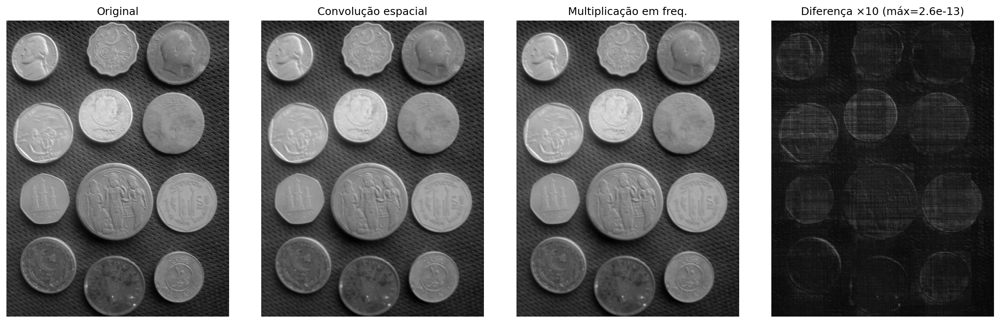

**Figura 5.5:** Verificação numérica do Teorema da Convolução: convolução espacial vs multiplicação em frequência.


In [14]:
# ── Kernel Gaussiano 11×11 ────────────────────────────────────────────────────
sigma  = 3.0;  K = 11
ks     = np.arange(K) - K // 2
gauss1d = np.exp(-ks**2 / (2 * sigma**2));  gauss1d /= gauss1d.sum()
kernel  = np.outer(gauss1d, gauss1d)         # kernel 2D separável

# ── Método 1: Convolução espacial direta (cv2) ────────────────────────────────
f_float  = img_gray.astype(np.float64)
conv_esp = cv2.filter2D(f_float, -1, kernel, borderType=cv2.BORDER_CONSTANT)

# ── Método 2: Multiplicação em frequência (FFT) ───────────────────────────────
M, N    = f_float.shape
Mpad    = 2 ** int(np.ceil(np.log2(M + K - 1)))   # potência de 2 após padding
Npad    = 2 ** int(np.ceil(np.log2(N + K - 1)))

kernel_pad           = np.zeros((Mpad, Npad))
kernel_pad[:K, :K]   = kernel

F_img   = np.fft.fft2(f_float, (Mpad, Npad))
F_kern  = np.fft.fft2(kernel_pad)
conv_freq = np.real(np.fft.ifft2(F_img * F_kern))

offset       = K // 2
conv_freq_crop = conv_freq[offset:offset+M, offset:offset+N]

# ── Verificação numérica ──────────────────────────────────────────────────────
diff = np.abs(conv_esp - conv_freq_crop)
print(f"Diferença máxima pixel a pixel : {diff.max():.2e}")
print(f"Diferença média                : {diff.mean():.2e}")
print("→ Teorema da Convolução verificado: as diferenças são de arredondamento numérico.")

conv_esp_vis  = cv2.normalize(conv_esp,        None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
conv_freq_vis = cv2.normalize(conv_freq_crop,  None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
diff_amp      = cv2.normalize(diff * 10,       None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

mm.show(
    [img_gray, conv_esp_vis, conv_freq_vis, diff_amp],
    titles=["Original", "Convolução espacial", "Multiplicação em freq.", f"Diferença ×10 (máx={diff.max():.1e})"],
    cols=4, figsize=(16, 5)
)

## 5.6 Filtros no Domínio da Frequência

### 5.6.1 Intuição Física: como um filtro "corta" frequências

Um filtro no domínio da frequência é, essencialmente, uma **máscara aplicada ao espectro**: valores próximos de 1 deixam a frequência passar; valores próximos de 0 a atenuam. A forma dessa máscara determina o comportamento visual do filtro.

```
         H(u,v)                        H(u,v)
   1 ──────╮                               ╭── 1
           │  Passa-Baixa                  │     Passa-Alta
   0       ╰─────────── D               0 ─╯
              D₀                          D₀
```

**O dilema do corte abrupto:** um filtro ideal (corte perfeito em $D_0$) parece ótimo na teoria, mas causa o **fenômeno de Gibbs** — oscilações (*ringing*) próximas às bordas dos objetos. Isso ocorre porque um corte abrupto no espectro corresponde, no domínio espacial, a uma convolução com uma função *sinc* de suporte infinito — que produz os anéis visíveis.

**A solução:** filtros com transição suave — Gaussiano ou Butterworth — eliminam o *ringing* ao custo de uma fronteira de corte menos precisa.

### 5.6.2 Os três filtros passa-baixa fundamentais

**1. Ideal (LPFI)** — corte binário em $D_0$:
$$H_{\text{ideal}}(u,v) = \begin{cases} 1 & D(u,v) \leq D_0 \\ 0 & D(u,v) > D_0 \end{cases}$$

**2. Gaussiano (LPFG)** — transição suave e sem *ringing*:
$$H_{\text{gauss}}(u,v) = e^{-D^2(u,v)/(2D_0^2)}$$

**3. Butterworth de ordem $n$ (LPFB)** — controla a "inclinação" da transição:
$$H_{\text{BW}}(u,v) = \frac{1}{1 + [D(u,v)/D_0]^{2n}}$$

onde $D(u,v) = \sqrt{(u - M/2)^2 + (v - N/2)^2}$ é a distância ao centro do espectro.

> ### 📝 Passa-alta e Passa-banda
>
> O complemento de qualquer filtro passa-baixa é um **filtro passa-alta**:
> $$H_{\text{HP}} = 1 - H_{\text{LP}}$$
>
> Filtros **passa-banda** combinam dois limiares, preservando apenas uma faixa de frequências. O filtro **notch** suprime frequências específicas — útil para eliminar ruído periódico que aparece como picos pontuais no espectro.

In [15]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div style="font-family:sans-serif;max-width:680px;margin:0 auto;padding:10px;">
<div style="text-align:center;font-size:12px;font-weight:bold;color:#374151;margin-bottom:8px;">
  Perfis dos Filtros Passa-Baixa — comparação visual (D₀ = 30)
</div>
<svg viewBox="0 0 640 200" xmlns="http://www.w3.org/2000/svg" style="width:100%;border:1px solid #e5e7eb;border-radius:8px;background:#fff;">
  <defs>
    <marker id="ah" markerWidth="6" markerHeight="6" refX="3" refY="3" orient="auto">
      <path d="M0,0 L6,3 L0,6 Z" fill="#9ca3af"/>
    </marker>
  </defs>
  <!-- Grid -->
  <line x1="60" y1="20" x2="60" y2="170" stroke="#e5e7eb" stroke-width="0.8"/>
  <line x1="60" y1="170" x2="610" y2="170" stroke="#e5e7eb" stroke-width="0.8"/>
  <!-- Eixos -->
  <line x1="60" y1="170" x2="605" y2="170" stroke="#9ca3af" stroke-width="1" marker-end="url(#ah)"/>
  <line x1="60" y1="175" x2="60" y2="15" stroke="#9ca3af" stroke-width="1" marker-end="url(#ah)"/>
  <text x="612" y="174" font-size="9" fill="#6b7280">D(u,v)</text>
  <text x="63" y="14" font-size="9" fill="#6b7280">H</text>
  <!-- Rótulos eixo Y -->
  <text x="52" y="35" font-size="8" fill="#6b7280" text-anchor="end">1.0</text>
  <text x="52" y="102" font-size="8" fill="#6b7280" text-anchor="end">0.5</text>
  <text x="52" y="173" font-size="8" fill="#6b7280" text-anchor="end">0.0</text>
  <line x1="57" y1="33" x2="63" y2="33" stroke="#9ca3af" stroke-width="0.8"/>
  <line x1="57" y1="100" x2="63" y2="100" stroke="#9ca3af" stroke-width="0.8"/>
  <!-- D0 marker -->
  <line x1="210" y1="30" x2="210" y2="175" stroke="#d1d5db" stroke-width="0.8" stroke-dasharray="3,3"/>
  <text x="210" y="184" font-size="8" fill="#9ca3af" text-anchor="middle">D₀</text>
  <!-- Filtro Ideal (vermelho) -->
  <polyline points="60,33 210,33 210,170 610,170" fill="none" stroke="#D85A30" stroke-width="2"/>
  <!-- Filtro Gaussiano (verde) -->
  <path d="M60,33 C100,33 130,40 160,60 S210,110 250,140 S320,168 610,170" fill="none" stroke="#1D9E75" stroke-width="2"/>
  <!-- Filtro Butterworth n=2 (azul) -->
  <path d="M60,33 C130,33 165,45 195,75 S225,130 250,148 S310,168 610,170" fill="none" stroke="#534AB7" stroke-width="2"/>
  <!-- Butterworth n=5 (roxo claro) -->
  <path d="M60,33 C170,33 195,40 208,70 S215,140 225,158 S260,170 610,170" fill="none" stroke="#9333ea" stroke-width="1.5" stroke-dasharray="5,3"/>
  <!-- Legenda -->
  <rect x="430" y="25" width="170" height="100" fill="#f9fafb" stroke="#e5e7eb" rx="4"/>
  <line x1="440" y1="45" x2="465" y2="45" stroke="#D85A30" stroke-width="2"/>
  <text x="470" y="49" font-size="9" fill="#374151">Ideal (corte perfeito)</text>
  <text x="470" y="60" font-size="8" fill="#9ca3af">→ ringing nas bordas</text>
  <line x1="440" y1="78" x2="465" y2="78" stroke="#1D9E75" stroke-width="2"/>
  <text x="470" y="82" font-size="9" fill="#374151">Gaussiano</text>
  <text x="470" y="93" font-size="8" fill="#9ca3af">→ sem ringing</text>
  <line x1="440" y1="106" x2="465" y2="106" stroke="#534AB7" stroke-width="2"/>
  <text x="470" y="110" font-size="9" fill="#374151">Butterworth n=2</text>
  <line x1="440" y1="118" x2="453" y2="118" stroke="#9333ea" stroke-width="1.5" stroke-dasharray="4,2"/>
  <text x="470" y="122" font-size="9" fill="#374151">Butterworth n=5</text>
  <!-- Zona de transição -->
  <text x="240" y="85" font-size="8" fill="#6b7280" font-style="italic">zona de</text>
  <text x="240" y="96" font-size="8" fill="#6b7280" font-style="italic">transição</text>
</svg>
<div style="font-size:10px;color:#6b7280;margin-top:6px;text-align:center;">
  À medida que a ordem do Butterworth aumenta, o perfil se aproxima do filtro Ideal — e o ringing aumenta.
</div>
</div>
""")

**Figura 5.6:** Diagrama interativo: perfis e efeitos dos filtros passa-baixa.


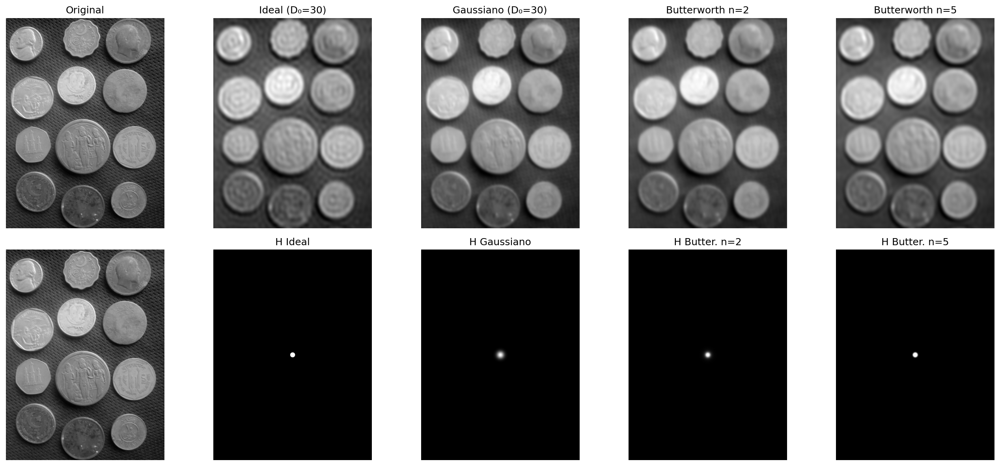

**Figura 5.7:** Comparação visual: filtros passa-baixa Ideal, Gaussiano e Butterworth aplicados à imagem de moedas.


Observe: o filtro Ideal produz ringing (anéis) visível nas bordas das moedas.
O Gaussiano suaviza sem artefatos. O Butterworth equilibra suavidade e precisão de corte.


In [16]:
import io

def distancia_centro(M, N):
    """Matriz de distâncias euclidianas ao centro do espectro (D₀ centralizado)."""    
    u = np.arange(M) - M // 2
    v = np.arange(N) - N // 2
    V, U = np.meshgrid(v, u)
    return np.sqrt(U**2 + V**2)

def aplicar_filtro_freq(img, H):
    """Aplica filtro H (espectro centralizado) à imagem via FFT."""    
    F  = np.fft.fftshift(np.fft.fft2(img.astype(np.float64)))
    Fg = F * H
    g  = np.real(np.fft.ifft2(np.fft.ifftshift(Fg)))
    return cv2.normalize(g, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

M, N = img_gray.shape
D    = distancia_centro(M, N)
D0   = 30

# ── Funções de transferência ──────────────────────────────────────────────────
H_ideal = (D <= D0).astype(np.float64)
H_gauss = np.exp(-D**2 / (2 * D0**2))
H_bw2   = 1.0 / (1.0 + (D / D0)**4)     # n=2
H_bw5   = 1.0 / (1.0 + (D / D0)**10)    # n=5

# ── Imagens filtradas ─────────────────────────────────────────────────────────
img_ideal = aplicar_filtro_freq(img_gray, H_ideal)
img_gauss = aplicar_filtro_freq(img_gray, H_gauss)
img_bw2   = aplicar_filtro_freq(img_gray, H_bw2)
img_bw5   = aplicar_filtro_freq(img_gray, H_bw5)

# ── Exibição dos filtros H ────────────────────────────────────────────────────
H_vis = lambda H: cv2.normalize((H*255).astype(np.uint8), None, 0, 255, cv2.NORM_MINMAX)

mm.show(
    [img_gray,  img_ideal,      img_gauss,      img_bw2,          img_bw5,
     img_gray,  H_vis(H_ideal), H_vis(H_gauss), H_vis(H_bw2),     H_vis(H_bw5)],
    titles=[
        "Original",    "Ideal (D₀=30)", "Gaussiano (D₀=30)", "Butterworth n=2", "Butterworth n=5",
        "",            "H Ideal",        "H Gaussiano",        "H Butter. n=2",   "H Butter. n=5"
    ],
    cols=5, figsize=(18, 8)
)
print("Observe: o filtro Ideal produz ringing (anéis) visível nas bordas das moedas.")
print("O Gaussiano suaviza sem artefatos. O Butterworth equilibra suavidade e precisão de corte.")

### 5.6.3 Remoção de Ruído Periódico com Filtro Notch

Ruído periódico — interferência elétrica de 60 Hz, grade de scanner, padrão de câmera CCD — manifesta-se no espectro de Fourier como **picos pontuais e simétricos** fora do centro. Esse comportamento é uma consequência direta da dualidade da DFT: uma senoide espacial pura produz dois coeficientes de Fourier não-nulos, localizados exatamente nas frequências correspondentes.

O **filtro notch** (rejeita-banda pontual) suprime esses picos sem afetar o restante do espectro, restaurando a imagem com mínima distorção.

PSNR (original vs restaurada): 31.48 dB


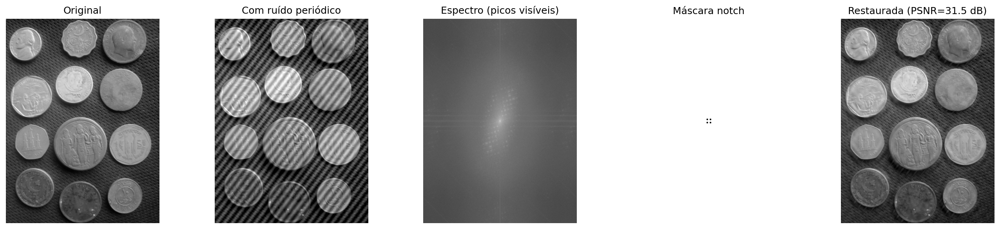

**Figura 5.8:** Remoção de ruído periódico via filtro notch: espectro revelando os picos e imagem restaurada.


In [17]:
# ── Imagem com ruído senoidal sintético ───────────────────────────────────────
h_img, w_img = img_gray.shape
x = np.arange(w_img);  y = np.arange(h_img)
X, Y = np.meshgrid(x, y)

# Ruído senoidal com componentes em (u0=20, v0=20)
ruido    = 40 * np.sin(2 * np.pi * (20 * X / w_img + 20 * Y / h_img))
img_ruid = np.clip(img_gray.astype(np.float64) + ruido, 0, 255).astype(np.uint8)

# ── Espectro da imagem ruidosa ────────────────────────────────────────────────
F_r   = np.fft.fftshift(np.fft.fft2(img_ruid.astype(np.float64)))
mag_r = np.log1p(np.abs(F_r))
mag_vis_r = cv2.normalize(mag_r, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# ── Máscara notch: suprime os 4 picos do ruído ────────────────────────────────
mascara = np.ones((h_img, w_img), dtype=np.float64)

def suprimir_pico(mask, cy, cx, r=10):
    yy, xx   = np.ogrid[:mask.shape[0], :mask.shape[1]]
    mask[np.sqrt((yy-cy)**2 + (xx-cx)**2) <= r] = 0
    return mask

cy0, cx0 = h_img // 2, w_img // 2
for dy, dx in [(+20,+20),(-20,-20),(+20,-20),(-20,+20)]:
    mascara = suprimir_pico(mascara, cy0+dy, cx0+dx, r=10)

mascara_vis = (mascara * 255).astype(np.uint8)

# ── Restauração ───────────────────────────────────────────────────────────────
F_rest   = F_r * mascara
img_rest = np.real(np.fft.ifft2(np.fft.ifftshift(F_rest)))
img_rest = np.clip(img_rest, 0, 255).astype(np.uint8)

psnr = cv2.PSNR(img_gray, img_rest)
print(f"PSNR (original vs restaurada): {psnr:.2f} dB")

mm.show(
    [img_gray, img_ruid, mag_vis_r, mascara_vis, img_rest],
    titles=["Original", "Com ruído periódico", "Espectro (picos visíveis)", "Máscara notch", f"Restaurada (PSNR={psnr:.1f} dB)"],
    cols=5, figsize=(18, 4)
)

### 📌 Síntese — Filtros Espectrais

| Filtro | Efeito visual | Artefato | Uso |
|:---|:---|:---|:---|
| Passa-baixa Ideal | Suavização forte | Ringing (anéis) | Ilustrativo apenas |
| Passa-baixa Gaussiano | Suavização suave | Nenhum | Suavização geral |
| Passa-baixa Butterworth | Suavização controlada | Ringing leve (ordens altas) | Compromisso suavidade/precisão |
| Passa-alta | Realce de bordas | Pode amplificar ruído | Detecção de contornos |
| Notch | Remove frequências específicas | Pode criar artefatos locais | Remoção de ruído periódico |

O design de filtros no domínio da frequência é direto e intuitivo — mas os artefatos espaciais (ringing, borramento) emergem de escolhas no espectro.

## 5.7 Wavelets e Análise Multi-escala

### 5.7.1 Fenômeno: o que Fourier não vê

A DFT decompõe a imagem em frequências **globais**: cada coeficiente $F(u,v)$ recebe contribuições de **todos** os pixels. Uma borda localizada no canto superior esquerdo da imagem se mistura ao espectro inteiro.

Esse é o problema de **localização temporal** (ou espacial): a DFT é excelente para dizer *quais* frequências existem, mas não diz *onde* elas estão.

As **wavelets** resolvem esse dilema oferecendo uma representação conjunta em **frequência e localização espacial**. A analogia musical é esclarecedora:

| Representação | Analogia musical | O que preserva |
|:---|:---|:---|
| DFT | Partitura com somente notas globais | Quais notas, não quando |
| Wavelet | Partitura completa com ritmo | Quais notas **e** quando |

### 5.7.2 A Decomposição Wavelet 2D

A **Transformada Wavelet Discreta 2D** (DWT) aplica, separadamente em linhas e colunas, dois filtros complementares: um **passa-baixa** $h$ (que captura aproximações) e um **passa-alta** $g$ (que captura detalhes). Após cada aplicação, o sinal é **subamostrado por 2** (decimado).

O resultado são quatro subbandas de resolução reduzida:

$$\text{DWT}(f) = \{\underbrace{\text{LL}}_{\text{aproximação}}, \underbrace{\text{LH}}_{\text{detalhes horiz.}}, \underbrace{\text{HL}}_{\text{detalhes vert.}}, \underbrace{\text{HH}}_{\text{detalhes diag.}}\}$$

A decomposição pode ser aplicada **recursivamente** sobre a subbanda LL — produzindo a análise **multirresolução**.

> ### 📝 Conexão com CNNs
>
> A estrutura hierárquica da DWT antecipa a arquitetura das **Redes Neurais Convolucionais** (CNNs):
>
> - As camadas de **convolução + pooling** das CNNs realizam análise multirresolução *aprendida*;
> - As subbandas **LH/HL/HH** correspondem a detectores de borda orientados;
> - A subbanda **LL** é a representação de baixa resolução que alimenta as camadas mais profundas.
>
> Em outras palavras, as CNNs "reinventaram" as wavelets — mas de forma adaptativa ao problema.

In [18]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div style="font-family:sans-serif;max-width:680px;margin:0 auto;padding:10px;">
<div style="text-align:center;font-size:12px;font-weight:bold;color:#374151;margin-bottom:8px;">
  Decomposição Wavelet 2D — Estrutura Multirresolução (2 níveis)
</div>
<svg viewBox="0 0 640 260" xmlns="http://www.w3.org/2000/svg" style="width:100%;border:1px solid #e5e7eb;border-radius:8px;background:#f9fafb;">
  <!-- Imagem original -->
  <rect x="20" y="80" width="100" height="100" fill="#dbeafe" stroke="#3b82f6" stroke-width="1.5" rx="3"/>
  <text x="70" y="126" font-size="10" fill="#1e40af" text-anchor="middle" font-weight="bold">f(x,y)</text>
  <text x="70" y="140" font-size="9" fill="#1e40af" text-anchor="middle">M × N</text>
  <!-- Seta 1 -->
  <line x1="120" y1="130" x2="165" y2="130" stroke="#6b7280" stroke-width="1.5" marker-end="url(#arr)"/>
  <text x="142" y="124" font-size="8" fill="#6b7280" text-anchor="middle">DWT</text>
  <!-- Bloco Nível 1: 4 subbandas -->
  <rect x="165" y="55" width="80" height="75" fill="#fef3c7" stroke="#f59e0b" stroke-width="1.2" rx="2"/>
  <text x="205" y="87" font-size="8" fill="#92400e" text-anchor="middle" font-weight="bold">LL₁</text>
  <text x="205" y="98" font-size="7" fill="#92400e" text-anchor="middle">aprox.</text>
  <text x="205" y="109" font-size="7" fill="#92400e" text-anchor="middle">M/2 × N/2</text>
  <rect x="245" y="55" width="80" height="75" fill="#dcfce7" stroke="#22c55e" stroke-width="1.2" rx="2"/>
  <text x="285" y="87" font-size="8" fill="#166534" text-anchor="middle" font-weight="bold">LH₁</text>
  <text x="285" y="98" font-size="7" fill="#166534" text-anchor="middle">horiz.</text>
  <rect x="165" y="130" width="80" height="75" fill="#fce7f3" stroke="#ec4899" stroke-width="1.2" rx="2"/>
  <text x="205" y="162" font-size="8" fill="#9d174d" text-anchor="middle" font-weight="bold">HL₁</text>
  <text x="205" y="173" font-size="7" fill="#9d174d" text-anchor="middle">vert.</text>
  <rect x="245" y="130" width="80" height="75" fill="#ede9fe" stroke="#8b5cf6" stroke-width="1.2" rx="2"/>
  <text x="285" y="162" font-size="8" fill="#5b21b6" text-anchor="middle" font-weight="bold">HH₁</text>
  <text x="285" y="173" font-size="7" fill="#5b21b6" text-anchor="middle">diag.</text>
  <!-- Rótulo nível 1 -->
  <text x="245" y="248" font-size="9" fill="#6b7280" text-anchor="middle">Nível 1 — M/2 × N/2 cada</text>
  <!-- Seta LL₁ → Nível 2 -->
  <line x1="205" y1="55" x2="205" y2="45" stroke="#6b7280" stroke-width="1" stroke-dasharray="3,2"/>
  <line x1="205" y1="45" x2="400" y2="45" stroke="#6b7280" stroke-width="1" stroke-dasharray="3,2"/>
  <line x1="400" y1="45" x2="400" y2="55" stroke="#6b7280" stroke-width="1" marker-end="url(#arr)" stroke-dasharray="3,2"/>
  <text x="302" y="40" font-size="8" fill="#6b7280" text-anchor="middle">DWT sobre LL₁</text>
  <!-- Bloco Nível 2: subbandas de LL₁ -->
  <rect x="360" y="55" width="50" height="45" fill="#fef3c7" stroke="#f59e0b" stroke-width="1.2" rx="2"/>
  <text x="385" y="75" font-size="8" fill="#92400e" text-anchor="middle" font-weight="bold">LL₂</text>
  <text x="385" y="88" font-size="7" fill="#92400e" text-anchor="middle">M/4×N/4</text>
  <rect x="410" y="55" width="50" height="45" fill="#dcfce7" stroke="#22c55e" stroke-width="1.2" rx="2"/>
  <text x="435" y="80" font-size="8" fill="#166534" text-anchor="middle" font-weight="bold">LH₂</text>
  <rect x="360" y="100" width="50" height="45" fill="#fce7f3" stroke="#ec4899" stroke-width="1.2" rx="2"/>
  <text x="385" y="125" font-size="8" fill="#9d174d" text-anchor="middle" font-weight="bold">HL₂</text>
  <rect x="410" y="100" width="50" height="45" fill="#ede9fe" stroke="#8b5cf6" stroke-width="1.2" rx="2"/>
  <text x="435" y="125" font-size="8" fill="#5b21b6" text-anchor="middle" font-weight="bold">HH₂</text>
  <text x="435" y="168" font-size="8" fill="#6b7280" text-anchor="middle">Nível 2</text>
  <!-- Legenda direita -->
  <rect x="490" y="55" width="140" height="130" fill="#fff" stroke="#e5e7eb" rx="4"/>
  <text x="560" y="73" font-size="9" fill="#374151" text-anchor="middle" font-weight="bold">Legenda</text>
  <rect x="500" y="82" width="12" height="12" fill="#fef3c7" stroke="#f59e0b"/>
  <text x="518" y="92" font-size="8" fill="#374151">LL — Aproximação</text>
  <rect x="500" y="100" width="12" height="12" fill="#dcfce7" stroke="#22c55e"/>
  <text x="518" y="110" font-size="8" fill="#374151">LH — Bordas horiz.</text>
  <rect x="500" y="118" width="12" height="12" fill="#fce7f3" stroke="#ec4899"/>
  <text x="518" y="128" font-size="8" fill="#374151">HL — Bordas vert.</text>
  <rect x="500" y="136" width="12" height="12" fill="#ede9fe" stroke="#8b5cf6"/>
  <text x="518" y="146" font-size="8" fill="#374151">HH — Detalhes diag.</text>
  <text x="560" y="168" font-size="8" fill="#6b7280" text-anchor="middle">Cada nível: ½ da</text>
  <text x="560" y="178" font-size="8" fill="#6b7280" text-anchor="middle">resolução anterior</text>
  <defs>
    <marker id="arr" markerWidth="6" markerHeight="6" refX="3" refY="3" orient="auto">
      <path d="M0,0 L6,3 L0,6 Z" fill="#6b7280"/>
    </marker>
  </defs>
</svg>
</div>
""")

**Figura 5.9:** Diagrama da decomposição wavelet 2D em dois níveis.


Original: (2560, 1920)
Nível 1 — LL₁: (1280, 960)   LH₁/HL₁/HH₁: (1280, 960)
Nível 2 — LL₂: (640, 480)   LH₂/HL₂/HH₂: (640, 480)


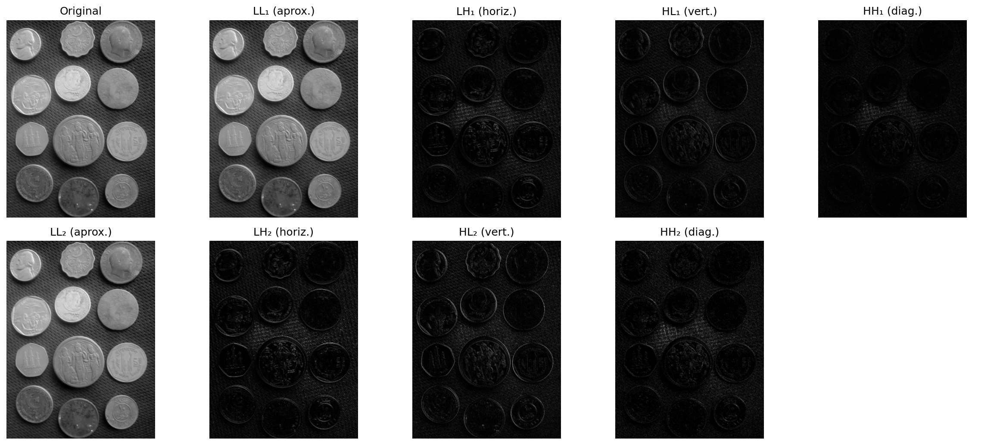

**Figura 5.10:** Decomposição wavelet Haar em 2 níveis: subbandas LL, LH, HL, HH em cada nível.


In [20]:
try:
    import pywt
except ImportError:
    import subprocess; subprocess.run(["pip", "install", "PyWavelets", "-q"])
    import pywt

img_float = img_gray.astype(np.float64)

# ── Decomposição Haar em 2 níveis ─────────────────────────────────────────────
LL1, (LH1, HL1, HH1) = pywt.dwt2(img_float, 'haar')
LL2, (LH2, HL2, HH2) = pywt.dwt2(LL1,       'haar')

def sb_vis(sb):
    """Normaliza subbanda para visualização."""    
    return cv2.normalize(np.abs(sb), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

print(f"Original: {img_gray.shape}")
print(f"Nível 1 — LL₁: {LL1.shape}   LH₁/HL₁/HH₁: {LH1.shape}")
print(f"Nível 2 — LL₂: {LL2.shape}   LH₂/HL₂/HH₂: {LH2.shape}")

mm.show(
    [img_gray, sb_vis(LL1), sb_vis(LH1), sb_vis(HL1), sb_vis(HH1),
               sb_vis(LL2), sb_vis(LH2), sb_vis(HL2), sb_vis(HH2)],
    titles=["Original",
            "LL₁ (aprox.)", "LH₁ (horiz.)", "HL₁ (vert.)", "HH₁ (diag.)",
            "LL₂ (aprox.)", "LH₂ (horiz.)", "HL₂ (vert.)", "HH₂ (diag.)"],
    cols=5, figsize=(16, 7)
)

### 5.7.3 Famílias de Wavelets

A escolha da wavelet determina o compromisso entre **localização**, **suavidade** e **compactação**:

| Wavelet | Suporte | Momentos nulos | Simetria | Uso típico |
|:---|:---:|:---:|:---:|:---|
| **Haar** | 2 | 1 | Assimétrica | Análise básica, educação |
| **Daubechies db4** | 8 | 4 | Assimétrica | Compressão, análise geral |
| **Symlet sym4** | 8 | 4 | Quase simétrica | Reconstrução de sinais |
| **Biortogonal 2.2** | 5/3 | 2/2 | Simétrica | JPEG 2000 (sem perda) |
| **Biortogonal 9/7** | 9/7 | 4/4 | Simétrica | JPEG 2000 (com perda) |

> **Momentos nulos** controlam a compactação: uma wavelet com $p$ momentos nulos produz coeficientes **exatamente nulos** para polinômios de grau até $p-1$, permitindo maior compressão em regiões suaves.

In [21]:
wavelets_comp = ["haar", "db4", "sym4", "bior2.2"]
imgs_comp, titles_comp = [], []

for wname in wavelets_comp:
    LL, (LH, HL, HH) = pywt.dwt2(img_float, wname)
    imgs_comp  += [sb_vis(LL), sb_vis(HH)]
    titles_comp += [f"{wname} — LL₁ (aprox.)", f"{wname} — HH₁ (diag.)"]

mm.show(imgs_comp, titles=titles_comp, cols=4, figsize=(14, 8))
print("Haar: bordas angulosas. db4/sym4: mais suaves. bior: melhor reconstrução.")

**Figura 5.11:** Comparação entre famílias de wavelets: subbandas LL₁ e HH₁.


Haar: bordas angulosas. db4/sym4: mais suaves. bior: melhor reconstrução.


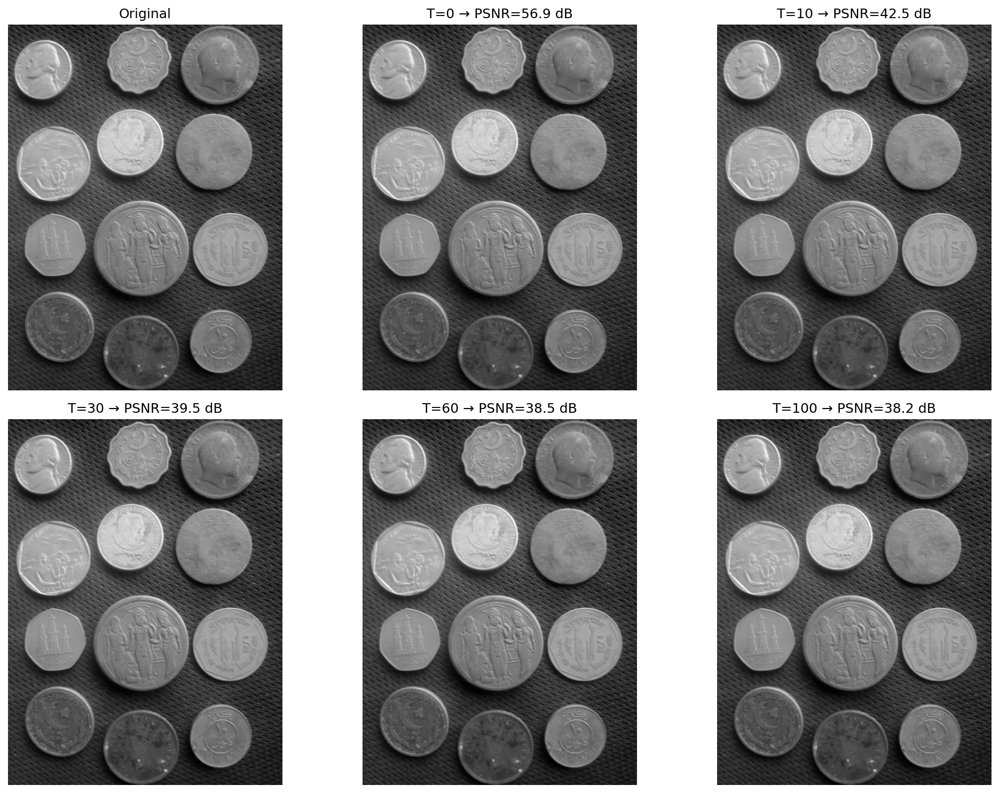

**Figura 5.12:** Limiamento de coeficientes wavelet: efeito do threshold na qualidade de reconstrução.


Limiamentos pequenos (T=10) removem ruído. Limiamentos grandes destroem estrutura.


In [23]:
def dwt_threshold_reconstruct(img, wavelet='db4', nivel=2, threshold=0.0):
    """Decompõe, aplica hard thresholding e reconstrói via IDWT."""    
    coefs  = pywt.wavedec2(img.astype(np.float64), wavelet, level=nivel)
    coefs_t = [coefs[0]]   # LL não é limiarizado
    for detalhe in coefs[1:]:
        coefs_t.append(tuple(pywt.threshold(sb, threshold, mode='hard') for sb in detalhe))
    rec = pywt.waverec2(coefs_t, wavelet)
    return np.clip(rec[:img.shape[0], :img.shape[1]], 0, 255).astype(np.uint8)

thresholds = [0, 10, 30, 60, 100]
imgs_thr, titles_thr = [img_gray], ["Original"]

for t in thresholds:
    rec  = dwt_threshold_reconstruct(img_gray, threshold=t)
    psnr = cv2.PSNR(img_gray, rec)
    imgs_thr.append(rec)
    titles_thr.append(f"T={t} → PSNR={psnr:.1f} dB")

mm.show(imgs_thr, titles=titles_thr, cols=3, figsize=(14, 10))
print("Limiamentos pequenos (T=10) removem ruído. Limiamentos grandes destroem estrutura.")

### 5.7.4 Fourier vs Wavelets: quando usar cada uma?

> ### 📝 Comparação conceitual
>
> | Critério | Fourier (DFT) | Wavelet (DWT) |
> |:---|:---|:---|
> | **Base** | Senoides de suporte infinito | Funções compactas, localizadas |
> | **Localização espacial** | ✗ — informação global | ✓ — frequência *e* posição |
> | **Filtragem espectral** | ✓ — controle preciso de banda | Limitado |
> | **Compressão** | DCT (JPEG) — excelente em blocos | DWT (JPEG 2000) — melhor para imagens inteiras |
> | **Análise multi-escala** | ✗ | ✓ — hierarquia natural |
> | **Ruído periódico** | ✓ — localização exata no espectro | ✗ |
> | **Texturas não-estacionárias** | ✗ | ✓ |
>
> **Regra prática:** use Fourier para filtragem espectral e remoção de ruído periódico; use wavelets para compressão, análise multi-escala e processamento de sinais não-estacionários.
---

## 5.8 Compressão de Imagens

### 5.8.1 O Problema da Redundância

Uma imagem de $512 \times 512$ pixels em RGB ocupa $512 \times 512 \times 3 = 786.432$ bytes ≈ 768 KB sem compressão. Padrões modernos armazenam a mesma imagem com 20–50 KB, com qualidade visual praticamente idêntica. Como?

A resposta está em **três tipos de redundância** que a representação bruta não explora:

| Tipo | Definição | Exemplo |
|:---|:---|:---|
| **Espacial** | Pixels vizinhos são altamente correlacionados | Regiões uniformes (céu, fundo) |
| **Espectral** | Canais R, G, B são correlacionados em fotos naturais | Pixels "brancos" têm R≈G≈B |
| **Psicovisual** | O SVH é insensível a variações de alta frequência em cores | Crominância pode ser subestimada |

A compressão é classificada em:

- **Sem perda (*lossless*):** reconstrução bit a bit exata — usada em imagens médicas, documentos técnicos, capturas de tela;
- **Com perda (*lossy*):** permite distorção controlada para maior compressão — usada em fotografia, streaming, web.

### 5.8.2 Transformada de Cossenos Discreta (DCT)

A DCT é a operação central do JPEG. Sua vantagem sobre a DFT: é **puramente real** e, para imagens naturais, **concentra mais energia nos coeficientes de baixa frequência** do que a DFT.

Para um bloco $8 \times 8$:

<a id="eq-05-dct"></a>
$$
C(u,v) = \alpha(u)\,\alpha(v) \sum_{x=0}^{7}\sum_{y=0}^{7} f(x,y)\,
\cos\!\left[\frac{\pi(2x+1)u}{16}\right]\cos\!\left[\frac{\pi(2y+1)v}{16}\right] \tag{5.4}
$$


> ### 📝 DCT vs DFT: qual concentra mais energia?
>
> A DCT assume **extensão par** do bloco — como se o sinal fosse refletido simetricamente nas bordas — o que elimina descontinuidades artificiais. O resultado: **muito mais energia nos primeiros coeficientes**. Tipicamente, o coeficiente DC de um bloco 8×8 contém 80–95% da energia total, permitindo que os demais sejam fortemente quantizados.

Coeficientes DCT do bloco 8×8:
[[192 -48   1   8   0  -1   0   0]
 [-96  54   7 -10   0   0   0   0]
 [ 14 -14   8   0   0   0   0   0]
 [  0   0 -11   1   0   0   0   0]
 [  9 -11   0   0   1   0   1   0]
 [  0   0   0   0   0   0   0   0]
 [  0   0   0   0  -1   0   0   0]
 [  0   0   0   0   0   0   0   0]]

Energia DC     : 36816.0
Energia total  : 52253.0
Fração no DC   : 70.5% ← concentração de energia


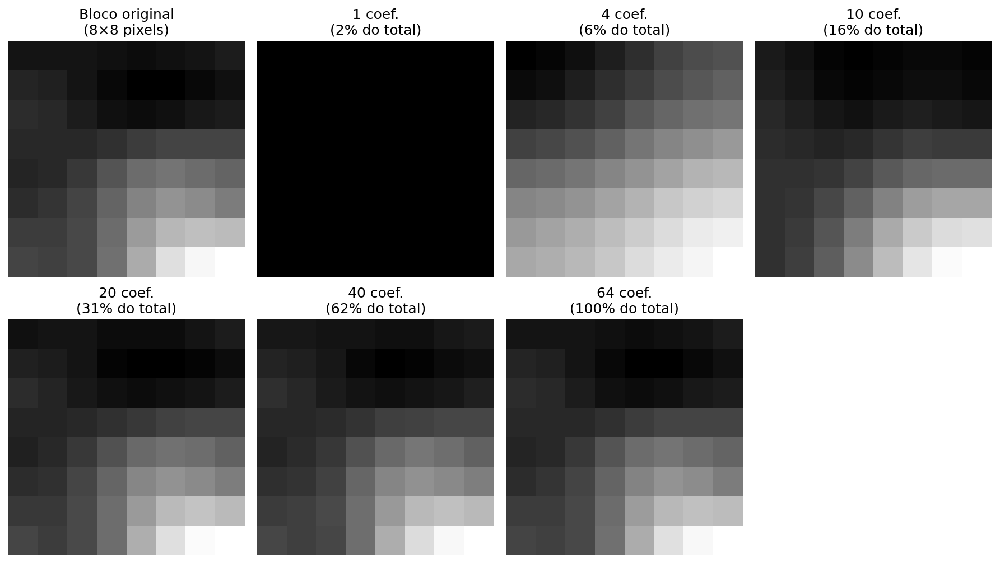

**Figura 5.13:** DCT 2D em bloco 8×8: coeficientes e reconstrução progressiva.


In [27]:
from scipy.fft import dct, idct

def dct2(bloco):
    """DCT-II 2D ortogonal (separável)."""    
    return dct(dct(bloco.T, norm='ortho').T, norm='ortho')

def idct2(coefs):
    """IDCT-II 2D ortogonal."""    
    return idct(idct(coefs.T, norm='ortho').T, norm='ortho')

# ── Bloco 8×8 centralizado da imagem ─────────────────────────────────────────
cy, cx = img_gray.shape[0]//2, img_gray.shape[1]//2
bloco  = img_gray[cy:cy+8, cx:cx+8].astype(np.float64) - 128.0

C = dct2(bloco)

print("Coeficientes DCT do bloco 8×8:")
print(np.round(C).astype(int))
print(f"\nEnergia DC     : {C[0,0]**2:.1f}")
print(f"Energia total  : {(C**2).sum():.1f}")
print(f"Fração no DC   : {C[0,0]**2 / (C**2).sum():.1%} ← concentração de energia")

# ── Reconstrução progressiva ──────────────────────────────────────────────────
imgs_rec  = [cv2.normalize((bloco+128).astype(np.uint8), None, 0, 255, cv2.NORM_MINMAX)]
titles_rec = ["Bloco original\n(8×8 pixels)"]

for keep in [1, 4, 10, 20, 40, 64]:
    C_trunc = np.zeros_like(C)
    indices = sorted([(u,v) for u in range(8) for v in range(8)], key=lambda p: p[0]+p[1])
    for u, v in indices[:keep]:
        C_trunc[u, v] = C[u, v]
    rec = np.clip(idct2(C_trunc) + 128, 0, 255).astype(np.uint8)
    imgs_rec.append(rec)
    titles_rec.append(f"{keep} coef.\n({keep/64:.0%} do total)")

mm.show(imgs_rec, titles=titles_rec, cols=4, figsize=(12, 7))

### 5.8.3 Pipeline JPEG Passo a Passo

O JPEG não é apenas "aplicar DCT". É um pipeline de seis etapas que combina transformadas, modelos perceptuais e codificação estatística:

```
RGB ──(1)──► YCbCr ──(2)──► Subamostragem ──(3)──► Blocos 8×8
                                                        │
JPEG ◄──(6)──Huffman ◄──(5)── Quantização ◄──(4)── DCT
```

**Etapa 1 — YCbCr:** separa luminância (Y) de crominância (Cb, Cr). O SVH é ~4× mais sensível a variações de brilho do que de cor.

**Etapa 2 — Subamostragem 4:2:0:** Cb e Cr são reduzidos à metade da resolução horizontal e vertical, eliminando ~50% dos dados de cor com impacto visual mínimo.

**Etapa 3 e 4 — Blocos 8×8 + DCT:** cada bloco é centrado (subtrai 128) e transformado. O tamanho 8×8 é um compromisso histórico: grande o suficiente para boa compactação energética, pequeno o suficiente para não criar blocos visíveis em qualidades moderadas.

**Etapa 5 — Quantização:** cada coeficiente é dividido por $Q(u,v)$ e arredondado:
$$\tilde{C}(u,v) = \text{round}\left(\frac{C(u,v)}{Q(u,v)}\right)$$

A tabela $Q$ é escalonada pelo **fator de qualidade** JPEG (1–100). Valores maiores de $Q$ → mais zeros → maior compressão → menor qualidade.

**Etapa 6 — Codificação entrópica:** coeficientes reordenados em *zigzag* (frequência crescente), sequências de zeros codificadas por *run-length encoding*, e comprimidas por Huffman.

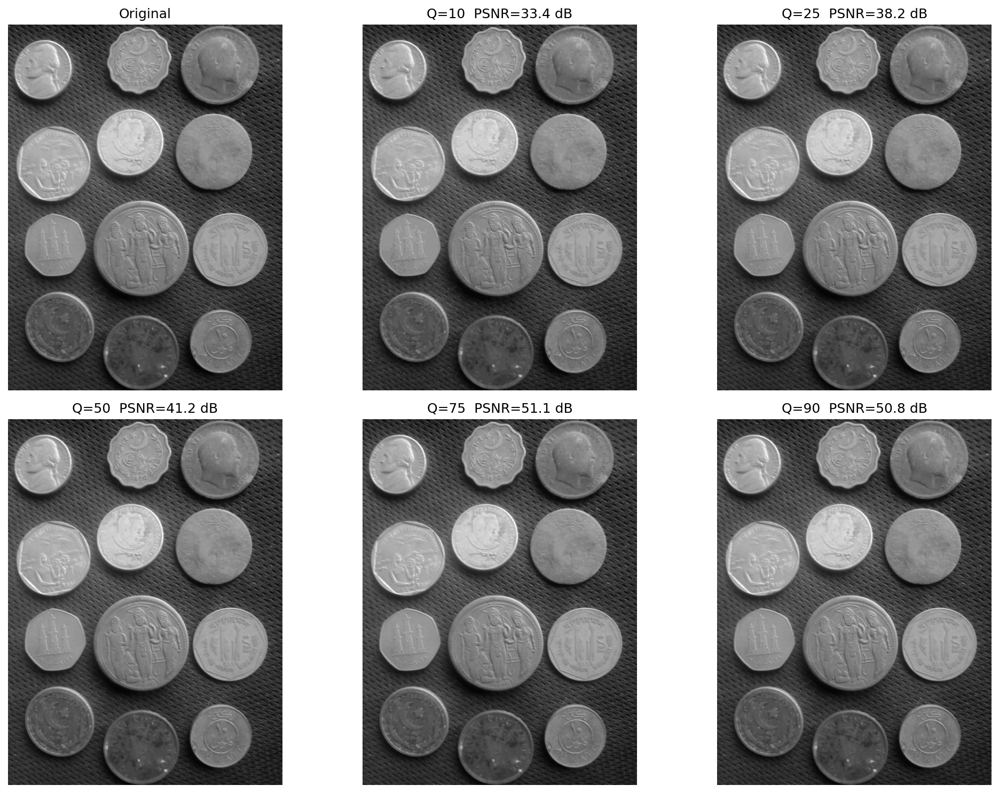

**Figura 5.14:** Pipeline JPEG simplificado: efeito do fator de qualidade na imagem e no PSNR.


Q≤25: artefatos de blocos visíveis (ringing nas bordas, blocos 8×8 visíveis).
Q≥75: qualidade visualmente aceitável para fotografia.


In [35]:
# ── Tabela de quantização padrão JPEG (luminância) ────────────────────────────
Q_luma = np.array([
    [16,11,10,16,24,40,51,61],[12,12,14,19,26,58,60,55],
    [14,13,16,24,40,57,69,56],[14,17,22,29,51,87,80,62],
    [18,22,37,56,68,109,103,77],[24,35,55,64,81,104,113,92],
    [49,64,78,87,103,121,120,101],[72,92,95,98,112,100,103,99]
], dtype=np.float64)

def jpeg_quality_compress(img, qualidade=50):
    """JPEG simplificado por blocos 8×8."""    
    s = 5000/qualidade if qualidade < 50 else 200 - 2*qualidade
    Q = np.clip(np.round(Q_luma * s / 100), 1, 255)
    h, w = img.shape
    result = np.zeros_like(img, dtype=np.float64)
    for r in range(0, h-7, 8):
        for c in range(0, w-7, 8):
            b   = img[r:r+8, c:c+8].astype(np.float64) - 128
            C   = dct2(b)
            Cq  = np.round(C / Q) * Q      # quantiza e dequantiza
            result[r:r+8, c:c+8] = np.clip(idct2(Cq) + 128, 0, 255)
    return result.astype(np.uint8)

qualidades = [10, 25, 50, 75, 90]
imgs_jpeg, titles_jpeg = [img_gray], ["Original"]

for q in qualidades:
    rec  = jpeg_quality_compress(img_gray, qualidade=q)
    psnr = cv2.PSNR(img_gray, rec)
    imgs_jpeg.append(rec)
    titles_jpeg.append(f"Q={q}  PSNR={psnr:.1f} dB")

mm.show(imgs_jpeg, titles=titles_jpeg, cols=3, figsize=(14, 10))
print("Q≤25: artefatos de blocos visíveis (ringing nas bordas, blocos 8×8 visíveis).")
print("Q≥75: qualidade visualmente aceitável para fotografia.")

### 5.8.4 Simulador Interativo: Quantização DCT

O simulador abaixo permite explorar o efeito da quantização sobre um bloco $8 \times 8$ real, visualizando em tempo real:

- os **coeficientes DCT** (mapa de calor — quanto maior, mais quente);
- os **coeficientes quantizados** (observe os zeros aparecerem com qualidade baixa);
- o **bloco reconstruído** e o erro de quantização.

In [28]:
# @title { display-mode: "form" }
from IPython.display import HTML

HTML("""
<div id="dct_Root">
<style>
  #dct_Root * { box-sizing: border-box; }
  #dct_Root { font-family: sans-serif; padding: 10px; max-width: 720px; margin: 0 auto; color: #374151; }
  #dct_Root canvas { display: block; border-radius: 6px; border: 1px solid #d1d5db; background: #fff; }
  #dct_Root button { font-size: 11px; padding: 5px 10px; border-radius: 4px; border: 1px solid #d1d5db; background: #fff; color: #374151; cursor: pointer; transition: background 0.15s; }
  #dct_Root button:hover { background: #f3f4f6; }
  .dct_panel { background: #f9fafb; border: 1px solid #e5e7eb; border-radius: 6px; padding: 8px; }
  .dct_stat_box { background: #f9fafb; border: 1px solid #e5e7eb; border-radius: 6px; padding: 8px; text-align: center; flex: 1; min-width: 80px; }
  .dct_stat_label { font-size: 9px; color: #6b7280; text-transform: uppercase; letter-spacing: 0.04em; margin-bottom: 2px; }
  .dct_stat_value { font-size: 15px; font-weight: bold; font-family: monospace; }
</style>
<div class="dct_panel" style="display:flex;justify-content:space-between;align-items:center;margin-bottom:10px;">
  <span style="font-size:12px;font-weight:bold;color:#4b5563;">⊞ Simulador: Quantização DCT-JPEG (bloco 8×8)</span>
</div>
<div style="display:flex;gap:8px;margin-bottom:10px;flex-wrap:wrap;">
  <div class="dct_stat_box"><div class="dct_stat_label">Qualidade</div><div id="dct_qual" class="dct_stat_value" style="color:#534AB7;">50</div></div>
  <div class="dct_stat_box"><div class="dct_stat_label">Coef. ≠ 0</div><div id="dct_nonzero" class="dct_stat_value" style="color:#1D9E75;">–</div></div>
  <div class="dct_stat_box"><div class="dct_stat_label">Zeros</div><div id="dct_zeros" class="dct_stat_value" style="color:#D85A30;">–</div></div>
  <div class="dct_stat_box"><div class="dct_stat_label">Erro MSE</div><div id="dct_mse" class="dct_stat_value" style="color:#BA7517;">–</div></div>
</div>
<div style="display:flex;gap:10px;flex-wrap:wrap;align-items:flex-start;">
  <div><div style="font-size:10px;color:#6b7280;margin-bottom:3px;">Bloco original (8×8)</div><canvas id="dct_cvOrig" width="160" height="160"></canvas></div>
  <div><div style="font-size:10px;color:#6b7280;margin-bottom:3px;">Coef. DCT (log abs)</div><canvas id="dct_cvDCT" width="160" height="160"></canvas></div>
  <div><div style="font-size:10px;color:#6b7280;margin-bottom:3px;">Coef. quantizados</div><canvas id="dct_cvQuant" width="160" height="160"></canvas></div>
  <div><div style="font-size:10px;color:#6b7280;margin-bottom:3px;">Bloco reconstruído</div><canvas id="dct_cvRec" width="160" height="160"></canvas></div>
</div>
<div class="dct_panel" style="margin-top:10px;">
  <div style="display:flex;align-items:center;gap:8px;">
    <label style="font-size:11px;font-weight:bold;">Qualidade JPEG:</label>
    <input type="range" id="dct_slider" min="1" max="100" value="50" style="flex:1;">
    <span id="dct_slVal" style="font-size:12px;font-family:monospace;min-width:30px;">50</span>
  </div>
  <div style="display:flex;gap:6px;margin-top:8px;">
    <button onclick="dct_setQ(5)">Q=5</button>
    <button onclick="dct_setQ(10)">Q=10</button>
    <button onclick="dct_setQ(25)">Q=25</button>
    <button onclick="dct_setQ(50)">Q=50</button>
    <button onclick="dct_setQ(75)">Q=75</button>
    <button onclick="dct_setQ(95)">Q=95</button>
  </div>
</div>
<script>
(function(){
  const dct_block=[[52,55,61,66,70,61,64,73],[63,59,55,90,109,85,69,72],[62,59,68,113,144,104,66,73],[63,58,71,122,154,106,70,69],[67,61,68,104,126,88,68,70],[79,65,60,70,77,68,58,75],[85,71,64,59,55,61,65,83],[87,79,69,68,65,76,78,94]];
  const Q_luma=[[16,11,10,16,24,40,51,61],[12,12,14,19,26,58,60,55],[14,13,16,24,40,57,69,56],[14,17,22,29,51,87,80,62],[18,22,37,56,68,109,103,77],[24,35,55,64,81,104,113,92],[49,64,78,87,103,121,120,101],[72,92,95,98,112,100,103,99]];
  function dct1d(x){const N=x.length,c=new Array(N).fill(0);for(let k=0;k<N;k++){let s=0;for(let n=0;n<N;n++)s+=x[n]*Math.cos(Math.PI*(2*n+1)*k/(2*N));c[k]=(k===0?Math.sqrt(1/N):Math.sqrt(2/N))*s;}return c;}
  function idct1d(c){const N=c.length,x=new Array(N).fill(0);for(let n=0;n<N;n++){let s=0;for(let k=0;k<N;k++)s+=(k===0?Math.sqrt(1/N):Math.sqrt(2/N))*c[k]*Math.cos(Math.PI*(2*n+1)*k/(2*N));x[n]=s;}return x;}
  function dct2d(blk){const N=8,rows=blk.map(r=>dct1d(r)),cols=[];for(let j=0;j<N;j++)cols.push(dct1d(rows.map(r=>r[j])));const out=Array.from({length:N},()=>new Array(N));for(let i=0;i<N;i++)for(let j=0;j<N;j++)out[i][j]=cols[j][i];return out;}
  function idct2d(C){const N=8,cols=[];for(let j=0;j<N;j++)cols.push(idct1d(C.map(r=>r[j])));const rows=Array.from({length:N},()=>new Array(N));for(let i=0;i<N;i++)for(let j=0;j<N;j++)rows[i][j]=cols[j][i];return rows.map(r=>idct1d(r));}
  function getQ(q){const s=q<50?5000/q:200-2*q;return Q_luma.map(row=>row.map(v=>Math.max(1,Math.min(255,Math.round(v*s/100)))));}
  function drawPixels(cv,data,mn,mx){const ctx=cv.getContext('2d'),sz=cv.width/8;for(let i=0;i<8;i++)for(let j=0;j<8;j++){const v=(data[i][j]-mn)/(mx-mn||1),g=Math.round(v*255);ctx.fillStyle=`rgb(${g},${g},${g})`;ctx.fillRect(j*sz,i*sz,sz,sz);ctx.strokeStyle='rgba(200,200,200,0.3)';ctx.lineWidth=0.5;ctx.strokeRect(j*sz,i*sz,sz,sz);ctx.fillStyle=g>128?'#333':'#eee';ctx.font=`bold ${Math.round(sz*0.28)}px monospace`;ctx.textAlign='center';ctx.textBaseline='middle';ctx.fillText(Math.abs(data[i][j])>999?'…':String(Math.round(data[i][j])),j*sz+sz/2,i*sz+sz/2);}}
  function drawHeat(cv,data){const ctx=cv.getContext('2d'),sz=cv.width/8,flat=data.flat(),mn=Math.min(...flat),mx=Math.max(...flat);for(let i=0;i<8;i++)for(let j=0;j<8;j++){const v=(data[i][j]-mn)/(mx-mn||1),r=Math.round(v*220+35),gb=Math.round((1-v)*180+30);ctx.fillStyle=`rgb(${r},${gb},${gb})`;ctx.fillRect(j*sz,i*sz,sz,sz);ctx.fillStyle='#fff';ctx.font=`bold ${Math.round(sz*0.22)}px monospace`;ctx.textAlign='center';ctx.textBaseline='middle';ctx.fillText(Math.abs(data[i][j])>999?'…':String(Math.round(data[i][j])),j*sz+sz/2,i*sz+sz/2);}}
  function update(q){
    const Q=getQ(q),centered=dct_block.map(r=>r.map(v=>v-128)),C=dct2d(centered);
    const Cq=C.map((r,i)=>r.map((v,j)=>Math.round(v/Q[i][j]))),Cdq=Cq.map((r,i)=>r.map((v,j)=>v*Q[i][j]));
    const rec=idct2d(Cdq).map(r=>r.map(v=>Math.max(0,Math.min(255,Math.round(v+128)))));
    const Clog=C.map(r=>r.map(v=>Math.log1p(Math.abs(v))*(v>=0?1:-1)));
    let nz=0,mse=0;for(let i=0;i<8;i++)for(let j=0;j<8;j++){if(Cq[i][j]!==0)nz++;mse+=(dct_block[i][j]-rec[i][j])**2;}mse/=64;
    drawPixels(document.getElementById('dct_cvOrig'),dct_block,0,255);
    drawHeat(document.getElementById('dct_cvDCT'),Clog);
    drawHeat(document.getElementById('dct_cvQuant'),Cq);
    drawPixels(document.getElementById('dct_cvRec'),rec,0,255);
    document.getElementById('dct_qual').textContent=q;
    document.getElementById('dct_nonzero').textContent=nz;
    document.getElementById('dct_zeros').textContent=64-nz;
    document.getElementById('dct_mse').textContent=mse.toFixed(1);
  }
  window.dct_setQ=function(q){document.getElementById('dct_slider').value=q;document.getElementById('dct_slVal').textContent=q;update(q);};
  document.getElementById('dct_slider').addEventListener('input',function(){document.getElementById('dct_slVal').textContent=this.value;update(+this.value);});
  update(50);
})();
</script>
</div>
""")

**Figura 5.15:** Simulador interativo de compressão DCT-JPEG em bloco 8×8.


## 5.9 Comparação de Formatos: JPEG, PNG e WebP

### 5.9.1 Perfil de Cada Formato

| Característica | JPEG | PNG | WebP |
|:---|:---:|:---:|:---:|
| **Compressão** | Com perda | Sem perda | Ambas |
| **Transparência** | ✗ | ✓ | ✓ |
| **Animação** | ✗ | Limitado | ✓ |
| **Algoritmo** | DCT + Huffman | DEFLATE | VP8/VP8L |
| **Melhor para** | Fotografia | Gráficos, texto | Web universal |
| **Pior para** | Texto, bordas nítidas | Fotos em alta res. | Compatibilidade legada |

### 5.9.2 Métricas de Qualidade

**PSNR** (*Peak Signal-to-Noise Ratio*) mede o erro pixel a pixel:
$$\text{PSNR} = 10\log_{10}\!\left(\frac{255^2}{\text{MSE}}\right) \;\text{[dB]}$$

**SSIM** (*Structural Similarity Index*) mede a semelhança estrutural, mais alinhada com a percepção humana:
$$\text{SSIM}(f,g) = \frac{(2\mu_f\mu_g + c_1)(2\sigma_{fg} + c_2)}{(\mu_f^2+\mu_g^2+c_1)(\sigma_f^2+\sigma_g^2+c_2)} \in [-1, 1]$$

> **Regra prática:** PSNR > 40 dB → qualidade excelente; 30–40 dB → boa; < 30 dB → artefatos visíveis.

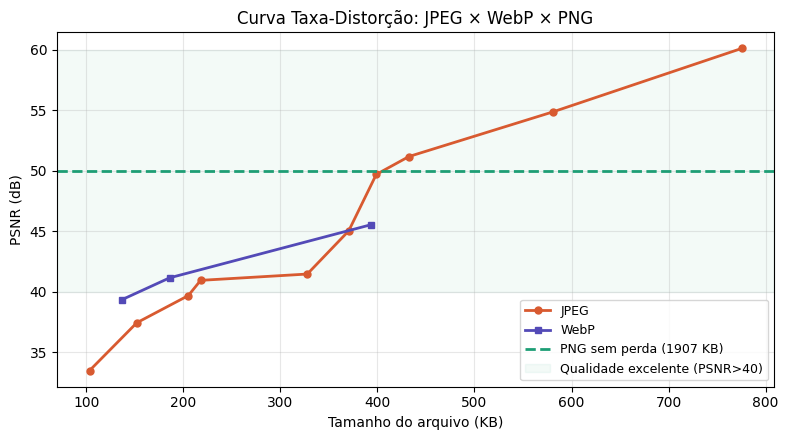

**Figura 5.16:** Curva taxa-distorção: PSNR vs tamanho de arquivo para JPEG, WebP e PNG.



Tamanho bruto (sem compressão): 4800 KB

 Formato  Qual.      KB   PSNR (dB)
--------------------------------------
    JPEG     10   103.3       33.50
    JPEG     20   152.0       37.45
    JPEG     30   205.1       39.70
    JPEG     40   217.8       40.96
    JPEG     50   327.7       41.48
    JPEG     60   370.4       45.04
    JPEG     70   398.8       49.71
    JPEG     80   432.4       51.19
    JPEG     90   581.0       54.88
    JPEG     95   775.3       60.12
     PNG lossless  1906.8 ∞ (lossless)
    WebP     50   137.0       39.37
    WebP     75   185.9       41.16
    WebP     90   393.1       45.55


In [29]:
import os

os.makedirs("imagens/comp_test", exist_ok=True)
resultados = []

# ── JPEG ──────────────────────────────────────────────────────────────────────
for q in [10, 20, 30, 40, 50, 60, 70, 80, 90, 95]:
    path = f"imagens/comp_test/coins_q{q}.jpg"
    cv2.imwrite(path, img_gray, [cv2.IMWRITE_JPEG_QUALITY, q])
    rec  = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    resultados.append({"formato": "JPEG", "qualidade": q,
                       "PSNR": cv2.PSNR(img_gray, rec),
                       "KB":   os.path.getsize(path)/1024})

# ── PNG ───────────────────────────────────────────────────────────────────────
path_png = "imagens/comp_test/coins.png"
cv2.imwrite(path_png, img_gray, [cv2.IMWRITE_PNG_COMPRESSION, 9])
resultados.append({"formato": "PNG", "qualidade": "lossless",
                   "PSNR": float('inf'), "KB": os.path.getsize(path_png)/1024})

# ── WebP ──────────────────────────────────────────────────────────────────────
for q in [50, 75, 90]:
    path_w = f"imagens/comp_test/coins_q{q}.webp"
    cv2.imwrite(path_w, img_gray, [cv2.IMWRITE_WEBP_QUALITY, q])
    rec_w  = cv2.imread(path_w, cv2.IMREAD_GRAYSCALE)
    resultados.append({"formato": "WebP", "qualidade": q,
                       "PSNR": cv2.PSNR(img_gray, rec_w),
                       "KB":   os.path.getsize(path_w)/1024})

# ── Curva taxa-distorção ──────────────────────────────────────────────────────
jpeg_r = [r for r in resultados if r["formato"]=="JPEG"]
webp_r = [r for r in resultados if r["formato"]=="WebP"]
png_r  = [r for r in resultados if r["formato"]=="PNG"]

fig, ax = plt.subplots(figsize=(8, 4.5))
ax.plot([r["KB"] for r in jpeg_r], [r["PSNR"] for r in jpeg_r],
        "o-", label="JPEG", color="#D85A30", lw=2, ms=5)
ax.plot([r["KB"] for r in webp_r], [r["PSNR"] for r in webp_r],
        "s-", label="WebP", color="#534AB7", lw=2, ms=5)
ax.axhline(50, color="#1D9E75", lw=2, ls="--",
           label=f"PNG sem perda ({png_r[0]['KB']:.0f} KB)")
ax.axhspan(40, 60, alpha=0.05, color="#1D9E75", label="Qualidade excelente (PSNR>40)")
ax.set(xlabel="Tamanho do arquivo (KB)", ylabel="PSNR (dB)",
       title="Curva Taxa-Distorção: JPEG × WebP × PNG")
ax.legend(fontsize=9); ax.grid(True, alpha=0.3); plt.tight_layout()
plt.show()

print(f"\nTamanho bruto (sem compressão): {img_gray.nbytes/1024:.0f} KB")
print(f"\n{'Formato':>8} {'Qual.':>6} {'KB':>7} {'PSNR (dB)':>11}")
print("-"*38)
for r in resultados:
    psnr_s = f"{r['PSNR']:>11.2f}" if r['PSNR']!=float('inf') else f"{'∞ (lossless)':>11}"
    print(f"{r['formato']:>8} {str(r['qualidade']):>6} {r['KB']:>7.1f} {psnr_s}")

In [33]:
try:
    from skimage.metrics import structural_similarity as ssim
except ImportError:
    import subprocess; subprocess.run(["pip","install","scikit-image","-q"])
    from skimage.metrics import structural_similarity as ssim

qualidades_ssim = [25, 50, 75, 95]
imgs_ssim   = [img_gray]
titles_ssim = ["Original"]

for q in qualidades_ssim:
    path = f"imagens/comp_test/coins_q{q}.jpg"
    rec  = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if rec is None: continue
    if rec.shape != img_gray.shape:
        rec = cv2.resize(rec, (img_gray.shape[1], img_gray.shape[0]))
    
    psnr_v = cv2.PSNR(img_gray, rec)
    ssim_v, _ = ssim(img_gray, rec, full=True)
    diff_vis = cv2.normalize(np.abs(img_gray.astype(float)-rec.astype(float)),
                             None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    
    imgs_ssim  += [rec, diff_vis]
    titles_ssim += [f"Q={q}  PSNR={psnr_v:.1f}dB\nSSIM={ssim_v:.3f}",
                    f"Mapa de erro (Q={q})\n(bordas = artefatos de bloco)"]

mm.show(imgs_ssim, titles=titles_ssim, cols=3, figsize=(14, 14))

[ WARN:0@7181.872] global loadsave.cpp:275 findDecoder imread_('imagens/comp_test/coins_q25.jpg'): can't open/read file: check file path/integrity
[ WARN:0@7183.702] global loadsave.cpp:275 findDecoder imread_('imagens/comp_test/coins_q75.jpg'): can't open/read file: check file path/integrity


**Figura 5.17:** Mapas de erro JPEG em diferentes qualidades: artefatos de bloco nas bordas.


### 📌 Síntese — Compressão JPEG

| Etapa | O que faz | Ganho |
|:---|:---|:---|
| YCbCr | Separa luminância de crominância | Modela percepção humana |
| Subamostragem 4:2:0 | Reduz Cb/Cr à metade | ~50% de dados a menos |
| DCT 8×8 | Concentra energia nos primeiros coeficientes | Alta compactação |
| Quantização | Zera coeficientes imperceptíveis | Principal fonte de compressão |
| Huffman | Codifica estatisticamente os zeros | ~30–50% adicional |

**Artefatos típicos de JPEG:**
- **Artefato de bloco** (qualidades baixas): fronteiras 8×8 visíveis;
- ***Ringing*** (qualidades muito baixas): oscilações ao redor de bordas nítidas;
- **Perda de textura** (qualidades baixas): regiões com textura fina ficam "plásticas".

## 5.10 Aplicação Prática: Pipeline de Denoising Espectral

Reunindo as ferramentas do capítulo, implementamos um *pipeline* completo de remoção de ruído misto (Gaussiano + periódico):

$$\text{Ruidosa} \xrightarrow{\text{FFT}} \xrightarrow{\text{Identificar picos}} \xrightarrow{\text{Butterworth + Notch}} \xrightarrow{\text{IFFT}} \text{Restaurada}$$

> ### 📝 Avaliação: PSNR e SSIM
>
> Os dois indicadores são **complementares**:
> - **PSNR** penaliza uniformemente todos os erros pixel a pixel — sensível a ruído de alta frequência;
> - **SSIM** avalia a preservação de estruturas perceptualmente relevantes — mais alinhado com o julgamento humano.
>
> Um bom filtro maximiza ambos. Na prática, filtros muito agressivos aumentam o PSNR da imagem ruidosa mas destroem o SSIM ao apagar texturas e bordas.

   Métrica |  Imagem ruidosa |  Após filtragem
----------------------------------------------
 PSNR (dB) |           19.97 |           21.21
      SSIM |          0.3478 |          0.6892


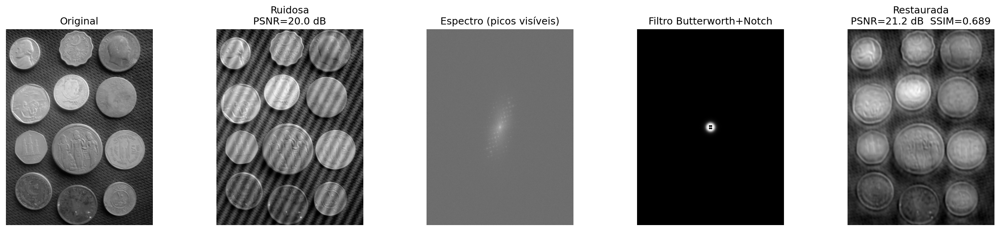

**Figura 5.18:** Pipeline completo: Butterworth + Notch para remoção de ruído misto.


In [32]:
np.random.seed(42)
h_img, w_img = img_gray.shape
X2, Y2 = np.meshgrid(np.arange(w_img), np.arange(h_img))

# ── 1. Ruído misto ────────────────────────────────────────────────────────────
ruido_gauss  = np.random.normal(0, 15, img_gray.shape)
ruido_period = 30 * np.sin(2 * np.pi * (15 * X2/w_img + 10 * Y2/h_img))
img_noisy    = np.clip(img_gray.astype(float) + ruido_gauss + ruido_period, 0, 255).astype(np.uint8)

# ── 2. Espectro ────────────────────────────────────────────────────────────────
F_n    = np.fft.fftshift(np.fft.fft2(img_noisy.astype(np.float64)))
mag_n  = cv2.normalize(np.log1p(np.abs(F_n)), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# ── 3. Filtro Butterworth (remove ruído gaussiano) ────────────────────────────
D_n    = distancia_centro(h_img, w_img)
H_bw   = 1.0 / (1.0 + (D_n / 60.0) ** 6)    # D0=60, n=3

# ── 4. Máscara notch (remove picos periódicos) ────────────────────────────────
mascara_dn = np.ones((h_img, w_img), dtype=np.float64)
for dy, dx in [(+15,+10),(-15,-10),(+15,-10),(-15,+10)]:
    mascara_dn = suprimir_pico(mascara_dn, h_img//2+dy, w_img//2+dx, r=12)

H_total = H_bw * mascara_dn

# ── 5. Filtragem e reconstrução ───────────────────────────────────────────────
img_den = np.real(np.fft.ifft2(np.fft.ifftshift(F_n * H_total)))
img_den = np.clip(img_den, 0, 255).astype(np.uint8)

# ── 6. Métricas ────────────────────────────────────────────────────────────────
psnr_n, ssim_n = cv2.PSNR(img_gray, img_noisy), ssim(img_gray, img_noisy)
psnr_d, ssim_d = cv2.PSNR(img_gray, img_den),   ssim(img_gray, img_den)

print(f"{'Métrica':>10} | {'Imagem ruidosa':>15} | {'Após filtragem':>15}")
print("-"*46)
print(f"{'PSNR (dB)':>10} | {psnr_n:>15.2f} | {psnr_d:>15.2f}")
print(f"{'SSIM':>10} | {ssim_n:>15.4f} | {ssim_d:>15.4f}")

H_vis_dn = cv2.normalize((H_total*255).astype(np.uint8), None, 0, 255, cv2.NORM_MINMAX)

mm.show(
    [img_gray, img_noisy, mag_n, H_vis_dn, img_den],
    titles=["Original",
            f"Ruidosa\nPSNR={psnr_n:.1f} dB",
            "Espectro (picos visíveis)",
            "Filtro Butterworth+Notch",
            f"Restaurada\nPSNR={psnr_d:.1f} dB  SSIM={ssim_d:.3f}"],
    cols=5, figsize=(18, 4)
)

## 5.11 Resumo do Capítulo

---
> ### 💡 📋 Mapa Conceitual — Transformadas e Compressão
>
> ```
> DOMÍNIO ESPACIAL                    DOMÍNIO DA FREQUÊNCIA
>      f(x,y)          ←── IDFT ───      F(u,v)
>         │                               │
>         │ DFT                           ├─ Magnitude |F| → energia por frequência
>         │                               └─ Fase φ(F)  → estrutura e posição
>         ▼
>    Convolução *h     ≡   Multiplicação · H  (Teorema da Convolução)
> ```
>
> | Tópico | Conceito central | Ferramenta |
> |:---|:---|:---|
> | **DFT 2D** | Frequências globais; magnitude e fase | `np.fft.fft2` |
> | **Teorema da Convolução** | Convolução ≡ multiplicação em frequência | FFT + IFFT |
> | **Filtros espectrais** | Passa-baixa, passa-alta, notch | Máscara no espectro |
> | **Wavelets** | Frequência + localização espacial | `pywt.dwt2` |
> | **DCT/JPEG** | Compactação de energia em blocos 8×8 | `scipy.fft.dct` |
> | **Formatos** | JPEG (foto), PNG (gráfico), WebP (web) | `cv2.imwrite` |
>
> **Cinco conclusões-chave:**
>
> 1. A **fase domina a percepção de forma** — a magnitude carrega a energia, mas a fase carrega a estrutura;
> 2. **Convolução via FFT** é dramaticamente mais eficiente para kernels grandes ($O(N^2 \log N)$ vs $O(N^2 K^2)$);
> 3. **Filtros Gaussiano e Butterworth** evitam o *ringing* do filtro Ideal — sempre prefira transições suaves;
> 4. **Wavelets** adicionam localização espacial à análise de frequência — fundamentais para compressão JPEG 2000 e CNNs;
> 5. **Artefatos de bloco JPEG** surgem da quantização agressiva de coeficientes DCT — perceptíveis em qualidades < 30.
---

O **Capítulo 6** abordará análise de cor: espaços de cor, histogramas multidimensionais e segmentação baseada em crominância.

## 5.12 🤖 Uso do NotebookLM como Tutor Complementar

> ### ❗ 🎓 Estude com o Tutor Inteligente
>
> [🚀 ACESSAR NOTEBOOKLM: CAPÍTULO 05](https://notebooklm.google.com/notebook/cap05)

## 5.13 Lista de Exercícios

1. **(10%)** Implemente a DFT 2D manualmente (sem `np.fft.fft2`) usando a definição da [Equação 5.1](#eq-05-dft) para uma imagem $16 \times 16$. Compare com `np.fft.fft2` e verifique diferenças absolutas menores que $10^{-8}$. Meça os tempos de execução e explique a diferença de desempenho.

2. **(15%)** Adicione ruído senoidal com frequências $(u_0, v_0) \in \{(5,10), (20,5), (30,30)\}$ à imagem de moedas. Para cada caso, projete um filtro notch e avalie a restauração com PSNR e SSIM. Discuta o compromisso entre remoção de ruído e preservação de detalhes.

3. **(15%)** Compare os filtros passa-baixa Ideal, Gaussiano e Butterworth (ordens $n=1,2,4$) com $D_0=20,40,60$ pixels. Calcule PSNR e SSIM da imagem filtrada para cada combinação. Apresente os resultados em uma tabela e plote os perfis $H(u,0)$.

4. **(15%)** Implemente a decomposição wavelet 2D Haar manualmente: calcule os filtros $h$ e $g$ de Haar, aplique por separabilidade em linhas e colunas, e subamostreie por 2. Compare com `pywt.dwt2(img, 'haar')` e verifique a equivalência numérica.

5. **(15%)** Aplique limiamento de coeficientes wavelet (*hard thresholding*) com $T \in \{5, 10, 20, 40, 80\}$ e wavelets Haar, db4 e sym4. Calcule PSNR e SSIM após reconstrução. Identifique a combinação wavelet × limiar que maximiza o SSIM.

6. **(15%)** Implemente o pipeline JPEG completo incluindo: conversão RGB → YCbCr, subamostragem 4:2:0 de Cb/Cr, DCT em blocos $8 \times 8$, quantização com tabela padrão escalada por fator de qualidade, e reconstrução. Compare com `cv2.imencode('.jpg', ...)` para qualidades 20, 50 e 80.

7. **(15%)** Crie uma imagem sintética com três regiões: textura natural (canto superior esquerdo), texto nítido (centro) e gradiente suave (canto inferior direito). Compare JPEG, PNG e WebP em termos de PSNR, SSIM e tamanho. Justifique o formato mais adequado para cada região.

## Referências do Capítulo


* Gonzalez e Woods (2018) — DFT 2D, filtros espectrais, DCT e fundamentos de compressão.
* Oppenheim (1999) — Teoria de sinais discretos e Teorema da Convolução.
* Mallat (1999) — Análise multirresolução, bancos de filtros e wavelets.
* Wallace (1991) — Padrão JPEG original e fundamentos da quantização DCT.
* Szeliski (2022) — Métricas PSNR/SSIM e comparação de formatos modernos.

GONZALEZ, R. C.; WOODS, R. E. **Digital Image Processing**. New York, Pearson, 2018.

MALLAT, St{\'e}phane. **A wavelet tour of signal processing**. Elsevier, 1999.

OPPENHEIM, Alan V. **Discrete-time signal processing**. Pearson Education India, 1999.

SZELISKI, Richard. **Computer Vision: Algorithms and Applications**. Springer, 2022.

WALLACE, Gregory K. **The {JPEG} Still Picture Compression Standard**. 1991.